In [142]:
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the .mat file (replace 'data/AAS010R01.mat' with your actual file path)
mat_data = scipy.io.loadmat(r'data\AAS010R01.mat')  # or use 'data/AAS010R01.mat'
signal = mat_data['signal']
print(signal.shape)
stimcode = mat_data['StimulusCode']
print(stimcode.shape)
stimtype = mat_data['StimulusType']
print(stimtype.shape)
# target
target_indices = np.where(np.isin(stimtype, 1))[0]
# non target
non_target_indices = np.where(np.isin(stimtype, 0))[0]
stim_indices = np.where(stimcode != 0)[0]
non_target_common_indices = np.intersect1d(non_target_indices, stim_indices)
# # Print the length of target and non_target indices
print("Length of target indices:", len(target_indices))
print("Length of non-target indices:", len(non_target_common_indices))
# Find the start of continuous sequences
target_start_indices = target_indices[np.insert(np.diff(target_indices) > 1, 0, True)]
nontarget_start_indices = non_target_common_indices[np.insert(np.diff(non_target_common_indices) > 1, 0, True)]
all_start_indices = stim_indices[np.insert(np.diff(stim_indices) > 1, 0, True)]
# # Print the length of target and non_target indices
print("Length of target indices:", len(target_start_indices))
print("Length of non-target indices:", len(nontarget_start_indices))
print("Length of all indices:", len(all_start_indices))

(26328, 64)
(26328, 1)
(26328, 1)
Length of target indices: 2160
Length of non-target indices: 10800
Length of target indices: 90
Length of non-target indices: 450
Length of all indices: 540


In [143]:
def extract_clippets(signal, indices, clip_length=240):
    """
    Extracts clippets from a signal based on specified indices.

    Parameters:
    - signal (np.ndarray): The input signal array.
    - indices (array-like): List or array of indices for clipping.
    - clip_length (int): Length of each clippet.

    Returns:
    - clippets (np.ndarray): An array of clippets (2D array).
    """
    clippets = []
    for idx in indices:
        # Check if the slice goes beyond the signal length
        if idx + clip_length <= len(signal):
            clippet = signal[idx:idx + clip_length]
            clippets.append(clippet)
        else:
            # If the slice is out of bounds, you can skip or pad
            print(f"Index {idx} out of bounds, skipping.")
    
    # Convert to NumPy array (optional)
    return np.array(clippets)

In [144]:
def plot_average_clips_with_difference(target_clips, nontarget_clips, sampling_rate=240, title = "test", vertical_time=0.3):
    """
    Plot the average signals for target and non-target clips together with time on the x-axis.
    Also plot the difference between target and non-target values and a vertical line at a specified time.

    Parameters:
    - target_clips (np.ndarray): 2D array of target signal clips.
    - nontarget_clips (np.ndarray): 2D array of non-target signal clips.
    - sampling_rate (int): Sampling rate in Hz to convert x-axis to time.
    - vertical_time (float): Time (in seconds) at which to draw a vertical line.
    """
    # Calculate the averages
    target_avg = np.mean(target_clips, axis=0)
    nontarget_avg = np.mean(nontarget_clips, axis=0)

    # Create time array based on sampling rate
    clip_length = target_avg.shape[0]
    time = np.arange(clip_length) / sampling_rate

    # Find the index corresponding to t = 0.3 seconds
    index_at_t = int(vertical_time * sampling_rate)

    # Calculate the difference at t = 0.3 seconds
    difference_at_t = target_avg[index_at_t] - nontarget_avg[index_at_t]

    # Plotting
    plt.figure(figsize=(12, 8))
    
    # Target and Non-Target Averages
    plt.plot(time, target_avg, label='Target Average', color='blue')
    plt.plot(time, nontarget_avg, label='Non-Target Average', color='orange')
    
    # Vertical line at t = 0.3 seconds
    plt.axvline(vertical_time, color='red', linestyle=':', label=f'Line at {vertical_time * 1000:.0f} ms')

    # Annotate the difference at t = 0.3 seconds
    plt.text(vertical_time, target_avg[index_at_t], f'Diff: {difference_at_t:.2f}', color='red', fontsize=12,
             verticalalignment='bottom', horizontalalignment='right')

    # Labels, Title, and Legend
    plt.title('Average Signals and Difference Between Target and Non-Target Clips')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.title(title)
    plt.grid(True)
    plt.show()

    print("difference", difference_at_t)
    return difference_at_t

### Section 2

In [145]:
ch11_signal = signal[:, 10]
ch23_signal = signal[:, 22]

Shape of target clips: (90, 240)
Shape of nontarget clips: (450, 240)


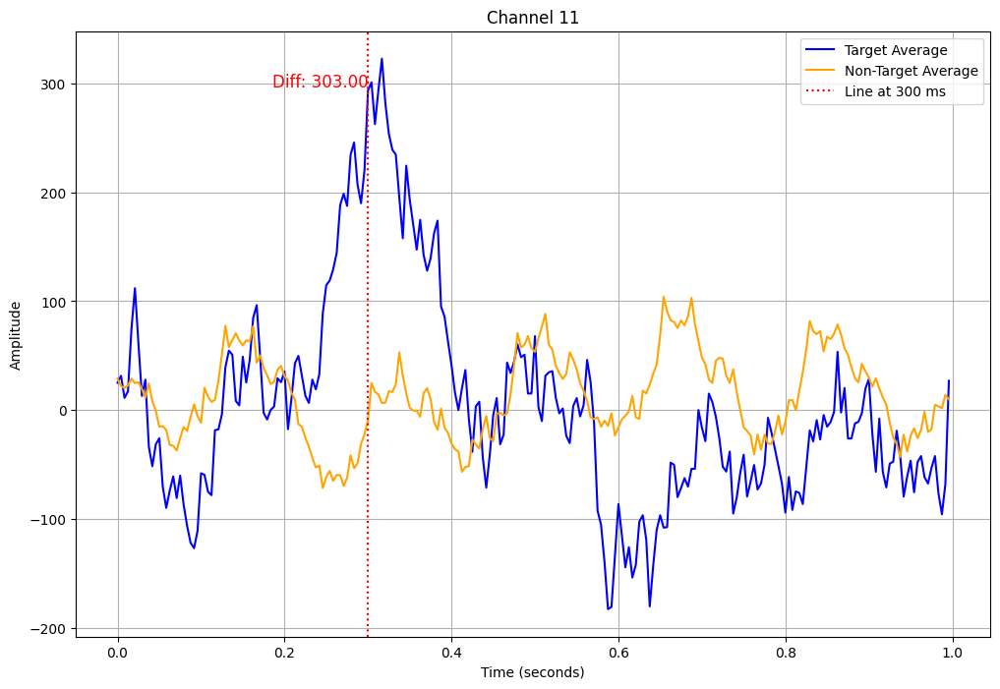

difference 303.0044444444444


303.0044444444444

In [146]:
# Assuming the extract_clippets function and signal data are already defined
ch11_target_clips = extract_clippets(ch11_signal, target_start_indices)
ch11_nontarget_clips = extract_clippets(ch11_signal, nontarget_start_indices)

# Print the shapes of the extracted clippets
print("Shape of target clips:", ch11_target_clips.shape)
print("Shape of nontarget clips:", ch11_nontarget_clips.shape)

plot_average_clips_with_difference(ch11_target_clips, ch11_nontarget_clips, sampling_rate=240, title="Channel 11")

Shape of target clips: (90, 240)
Shape of nontarget clips: (450, 240)


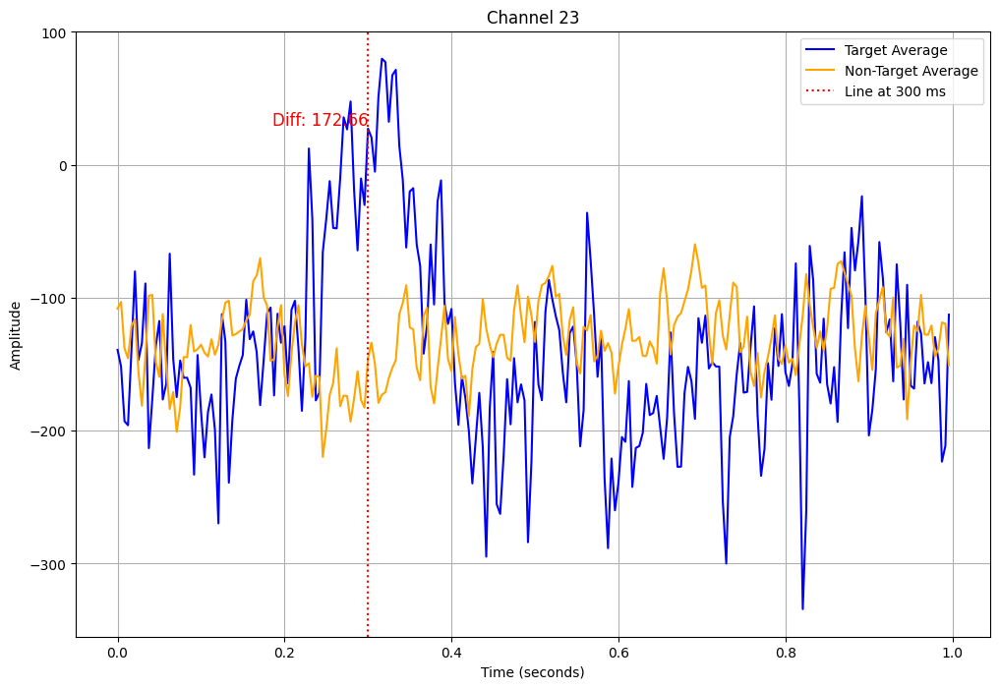

difference 172.65777777777777


172.65777777777777

In [147]:
# Assuming the extract_clippets function and signal data are already defined
ch23_target_clips = extract_clippets(ch23_signal, target_start_indices)
ch23_nontarget_clips = extract_clippets(ch23_signal, nontarget_start_indices)

# Print the shapes of the extracted clippets
print("Shape of target clips:", ch23_target_clips.shape)
print("Shape of nontarget clips:", ch23_nontarget_clips.shape)

plot_average_clips_with_difference(ch23_target_clips, ch23_nontarget_clips, sampling_rate=240, title="Channel 23")

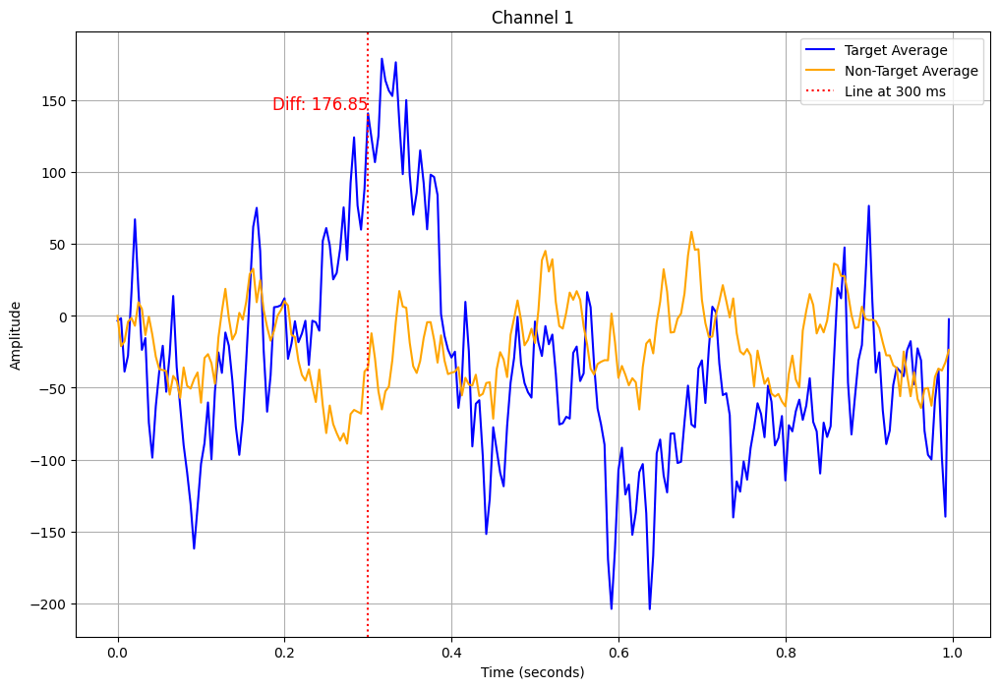

difference 176.85333333333335


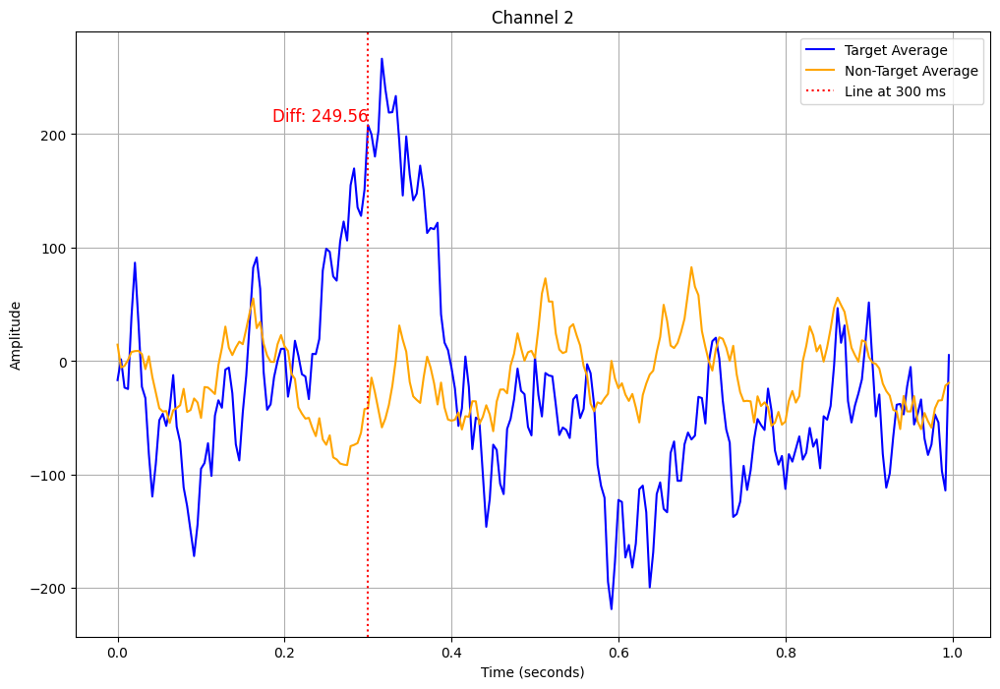

difference 249.56444444444446


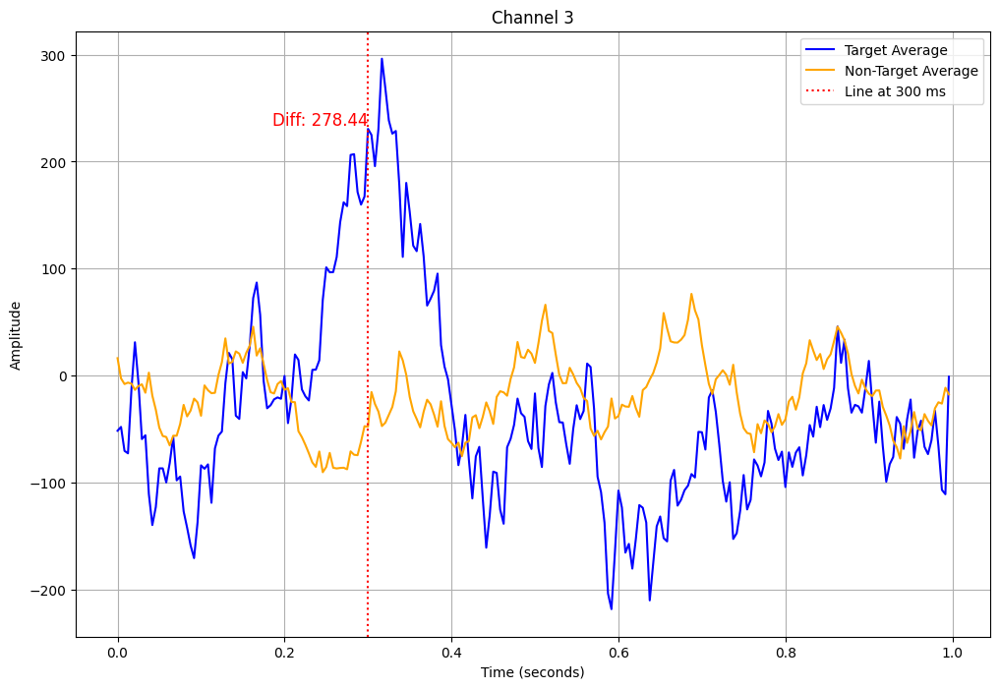

difference 278.43555555555554


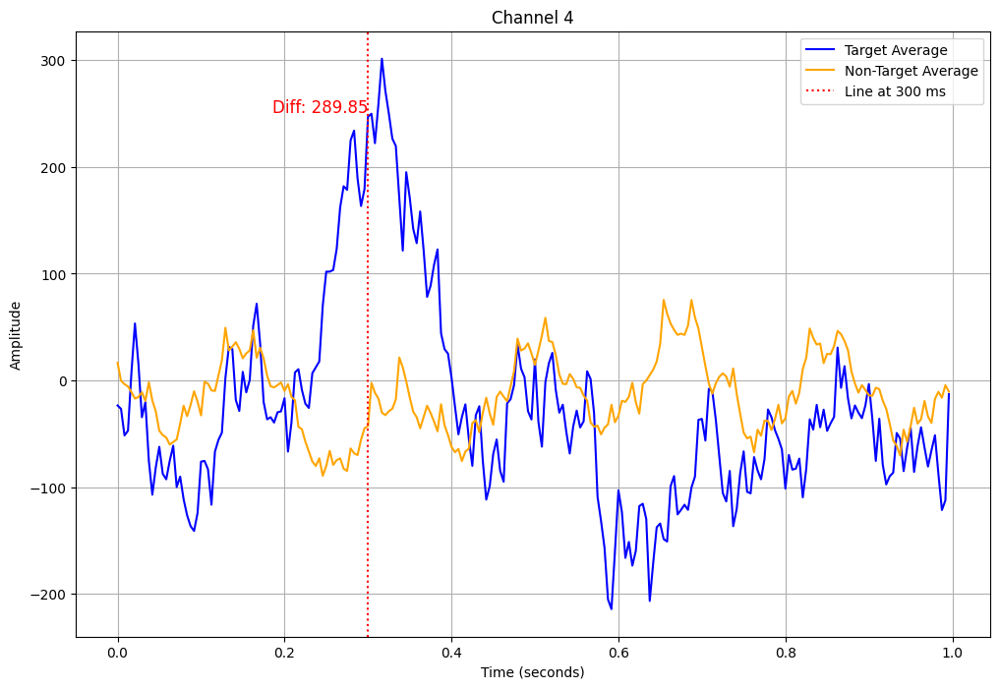

difference 289.8488888888889


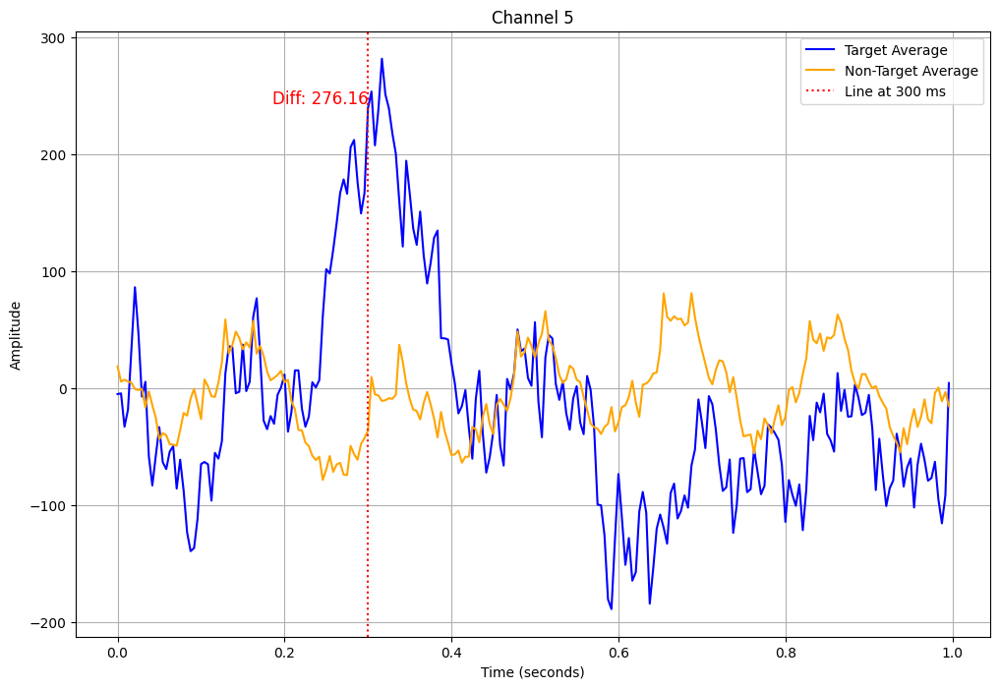

difference 276.16


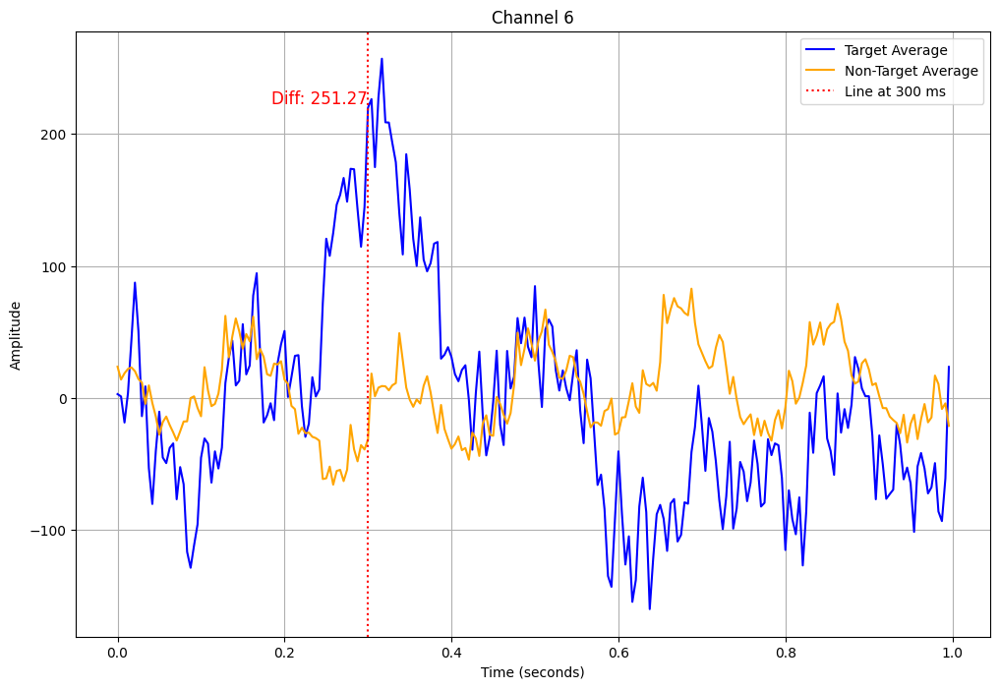

difference 251.2711111111111


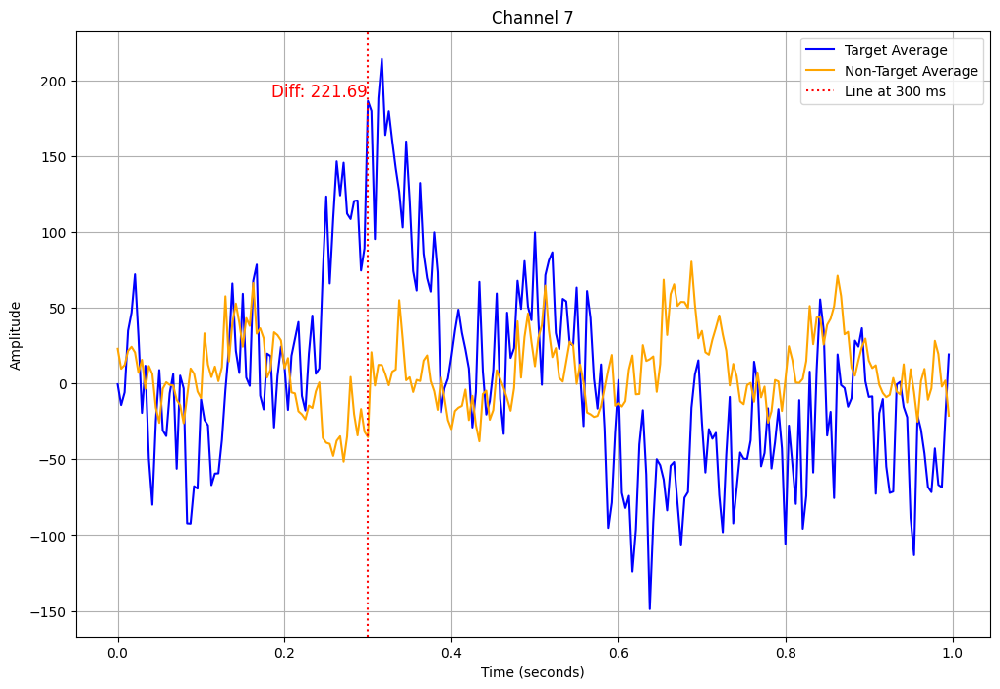

difference 221.68888888888887


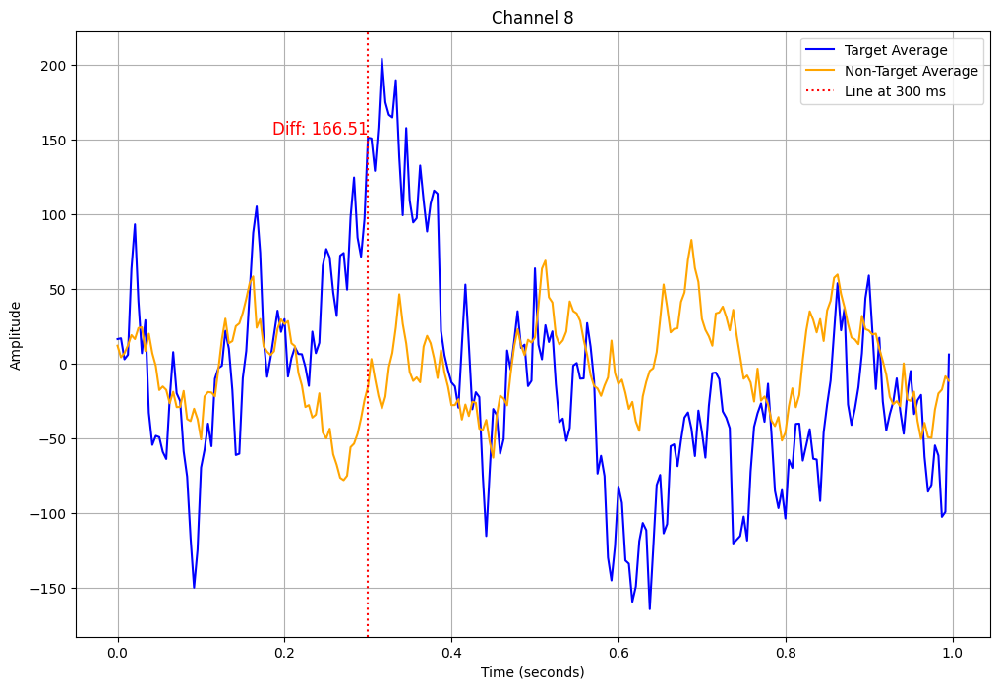

difference 166.50666666666666


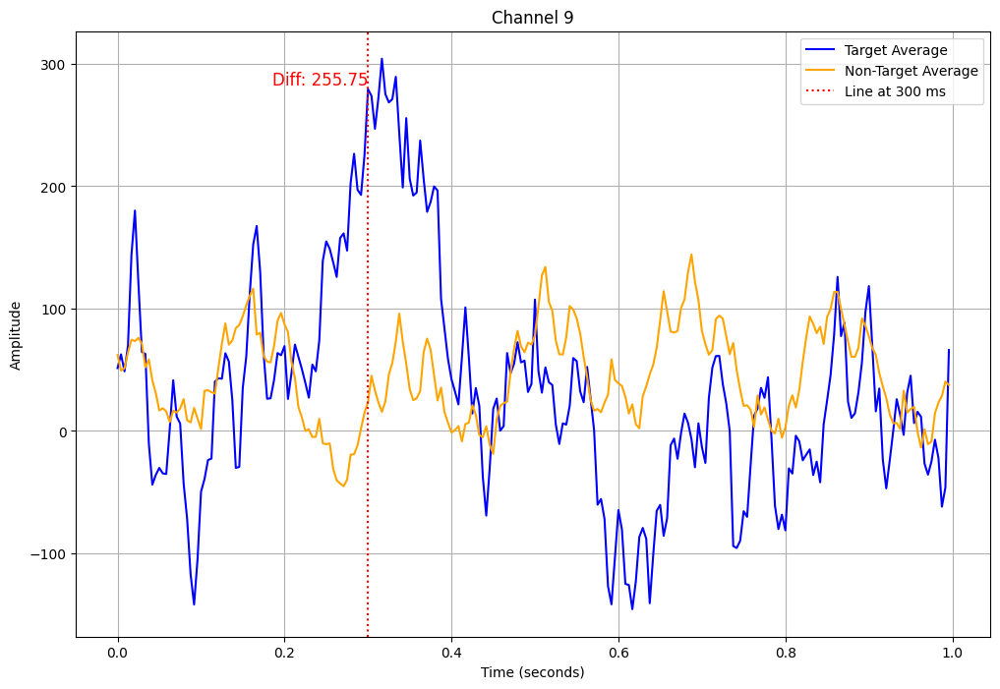

difference 255.75111111111113


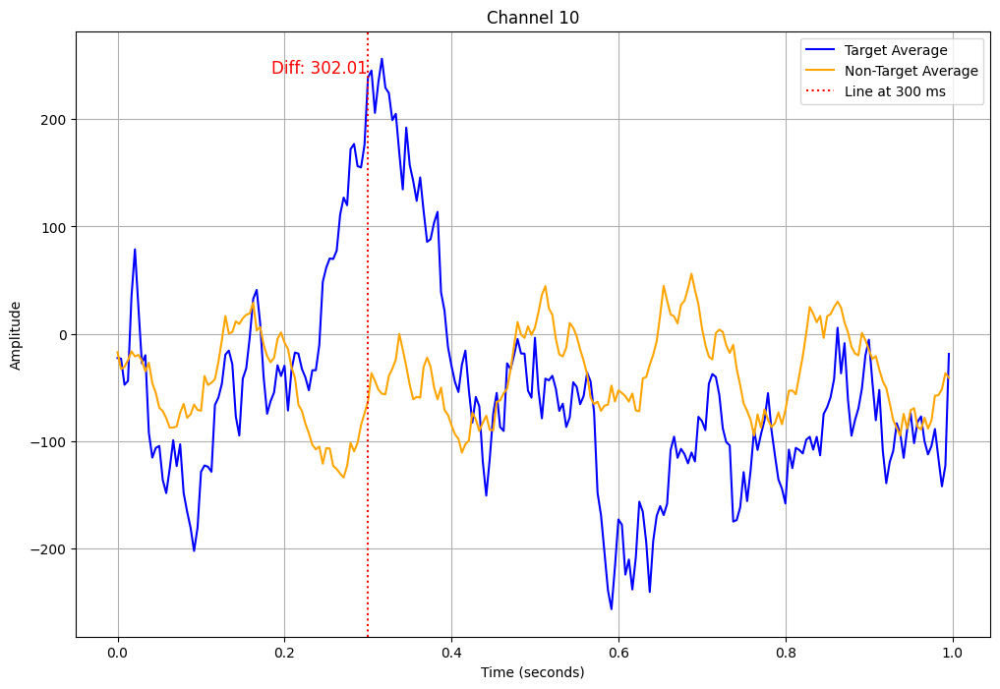

difference 302.0088888888889


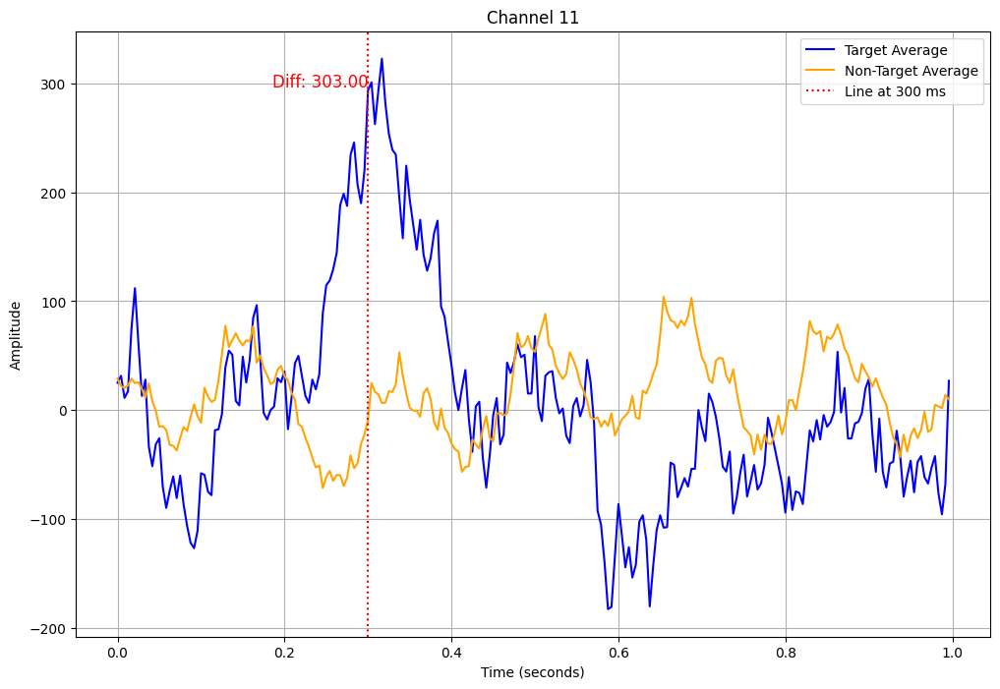

difference 303.0044444444444


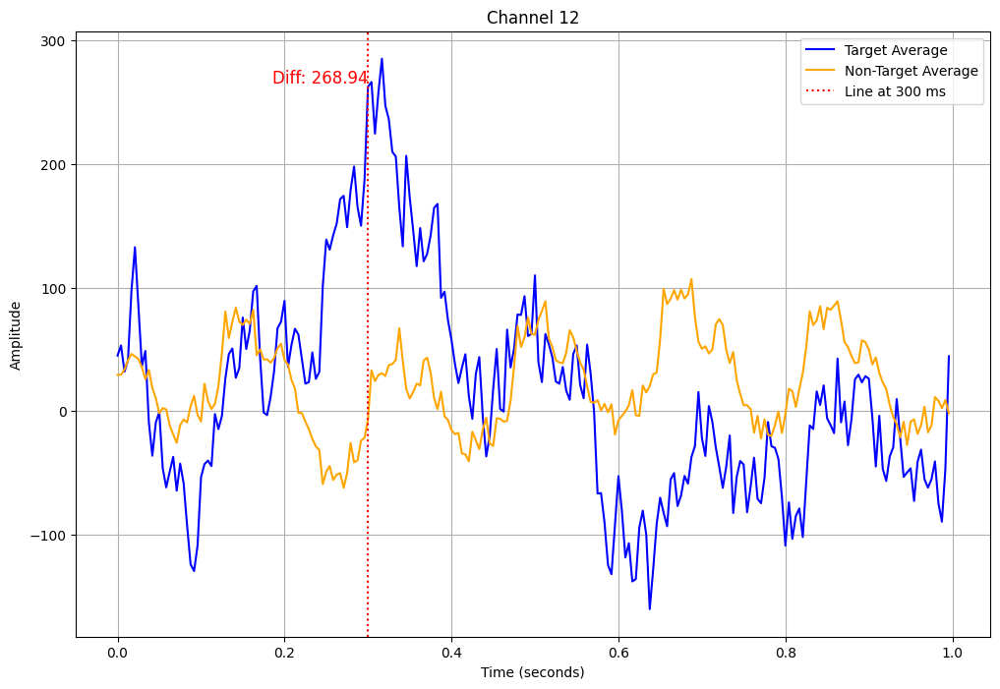

difference 268.9422222222222


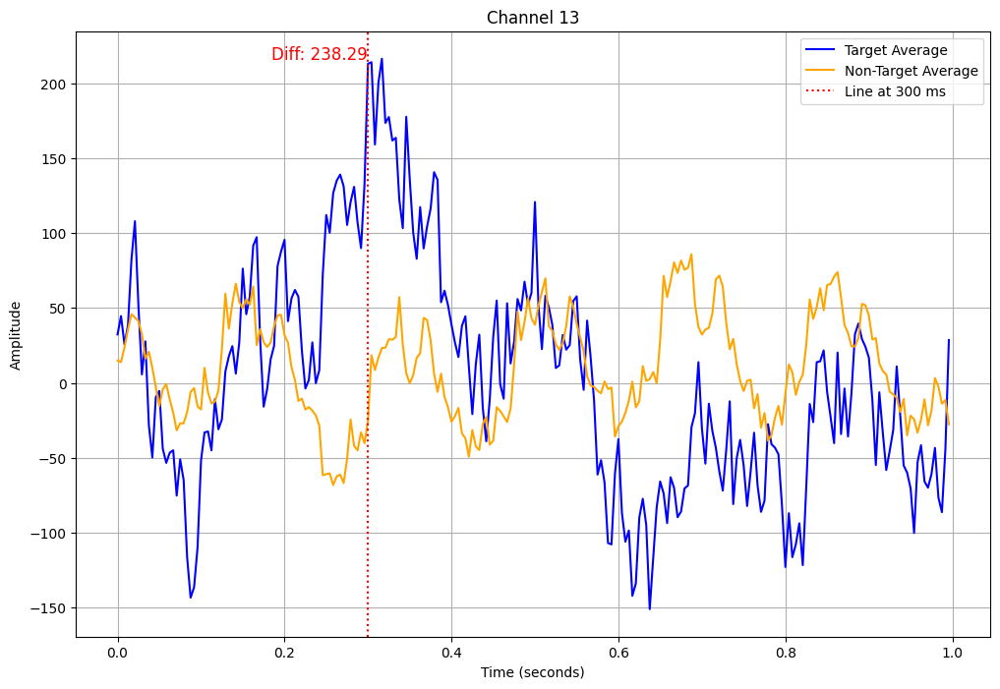

difference 238.29333333333335


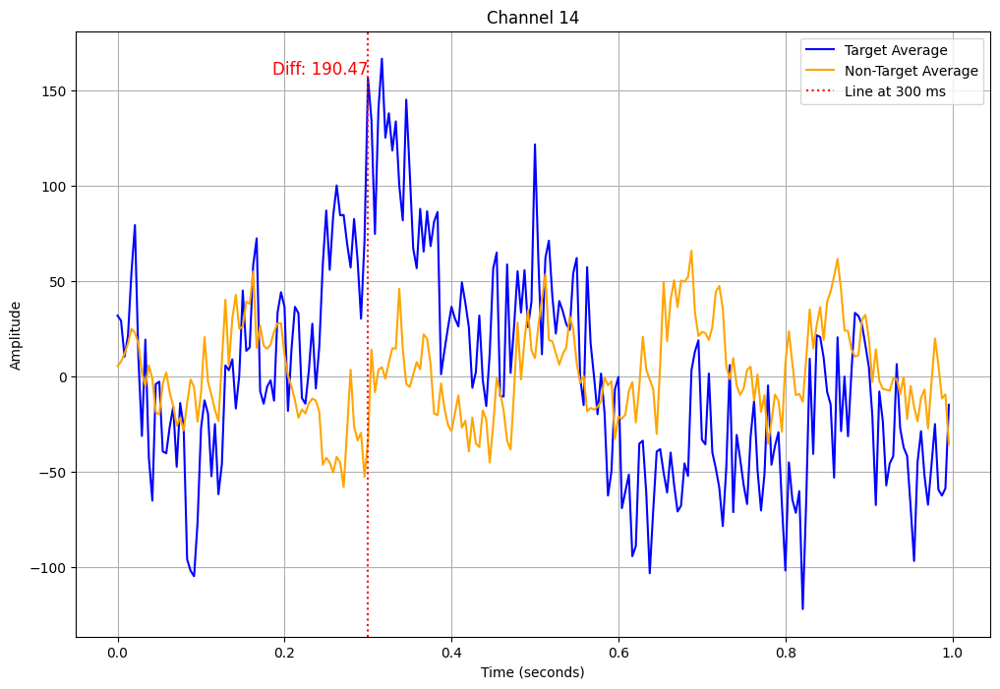

difference 190.47111111111113


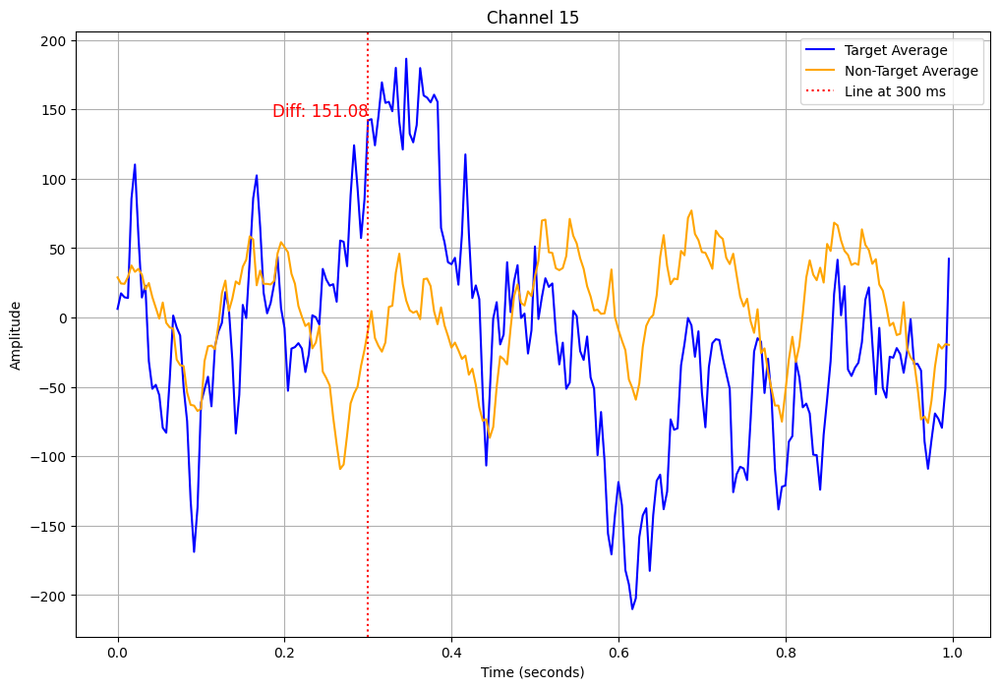

difference 151.07555555555555


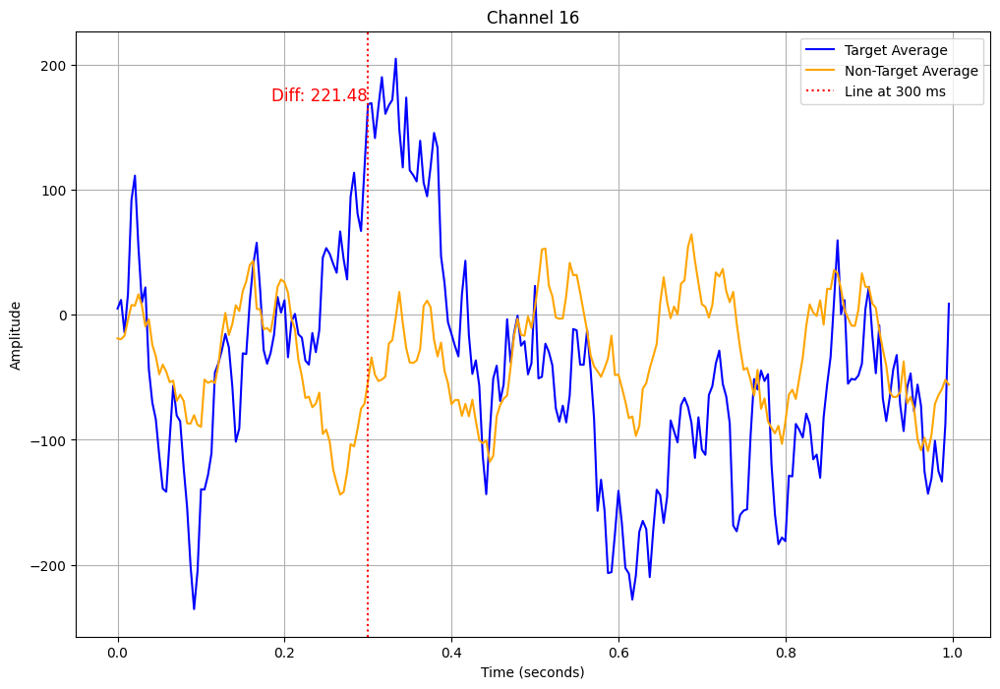

difference 221.47555555555556


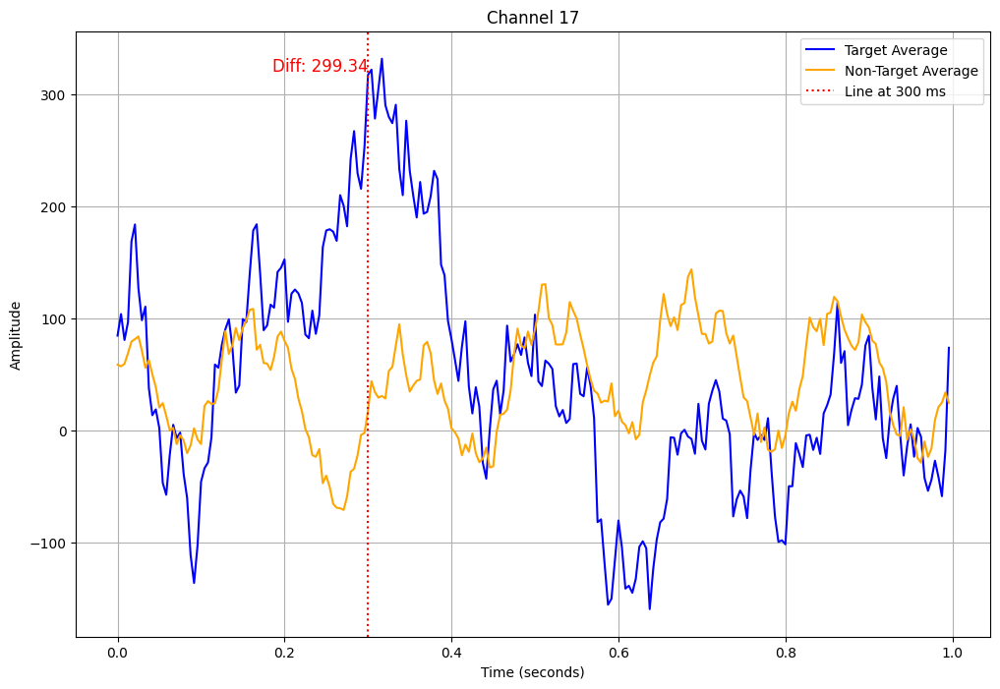

difference 299.3422222222222


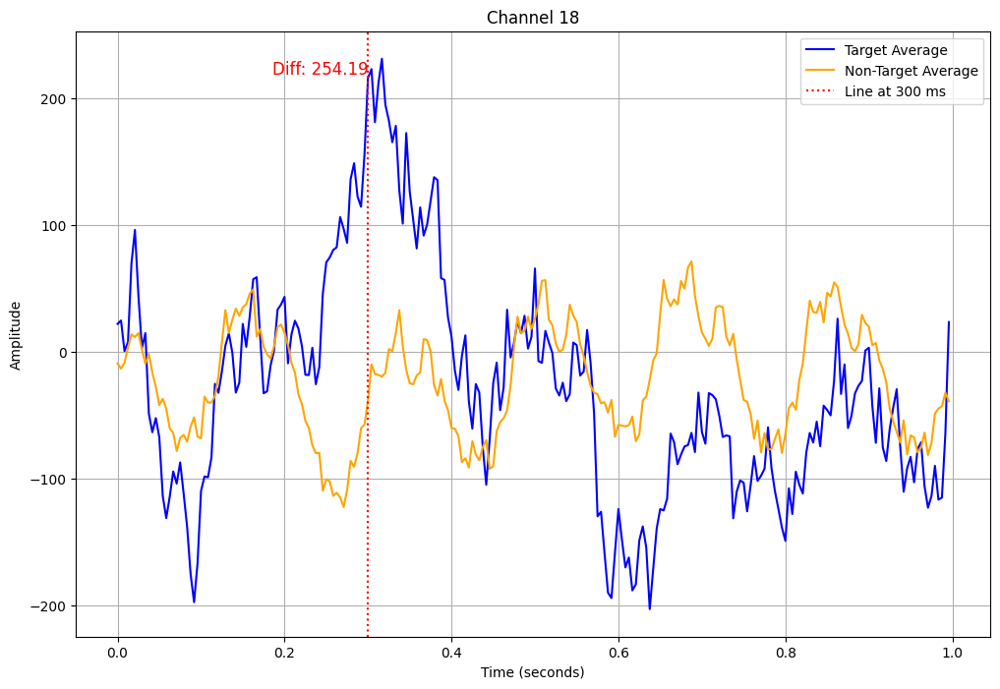

difference 254.18666666666667


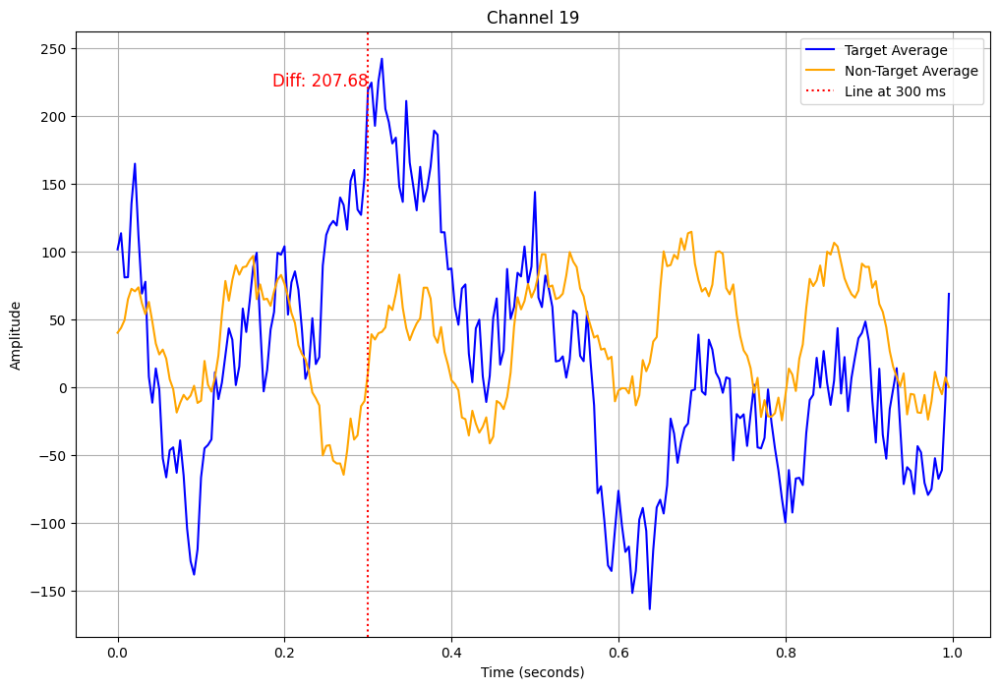

difference 207.67999999999998


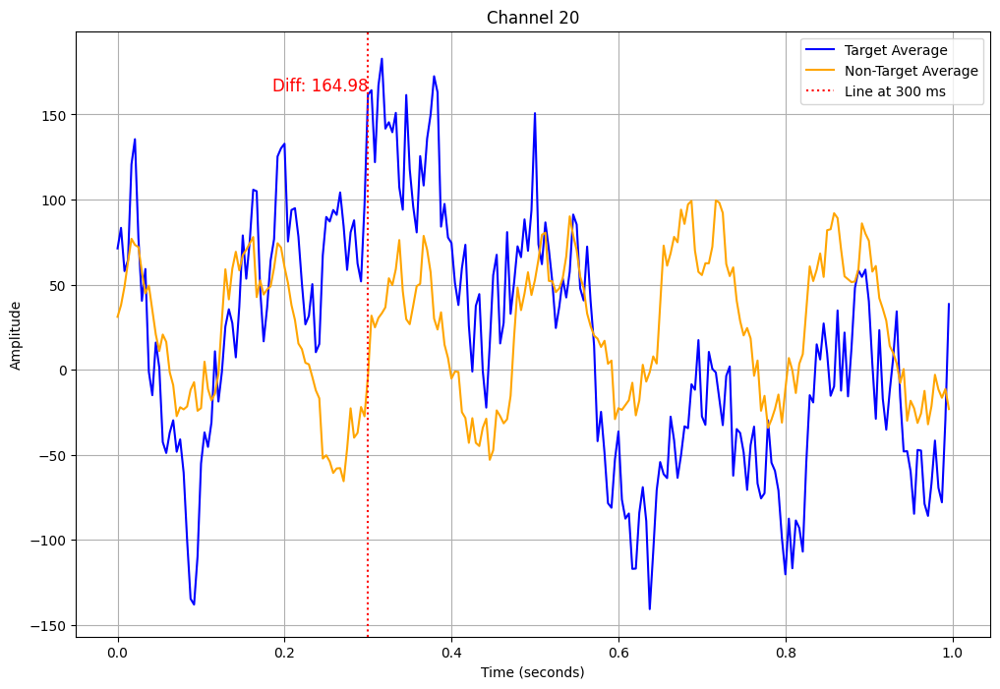

difference 164.97777777777776


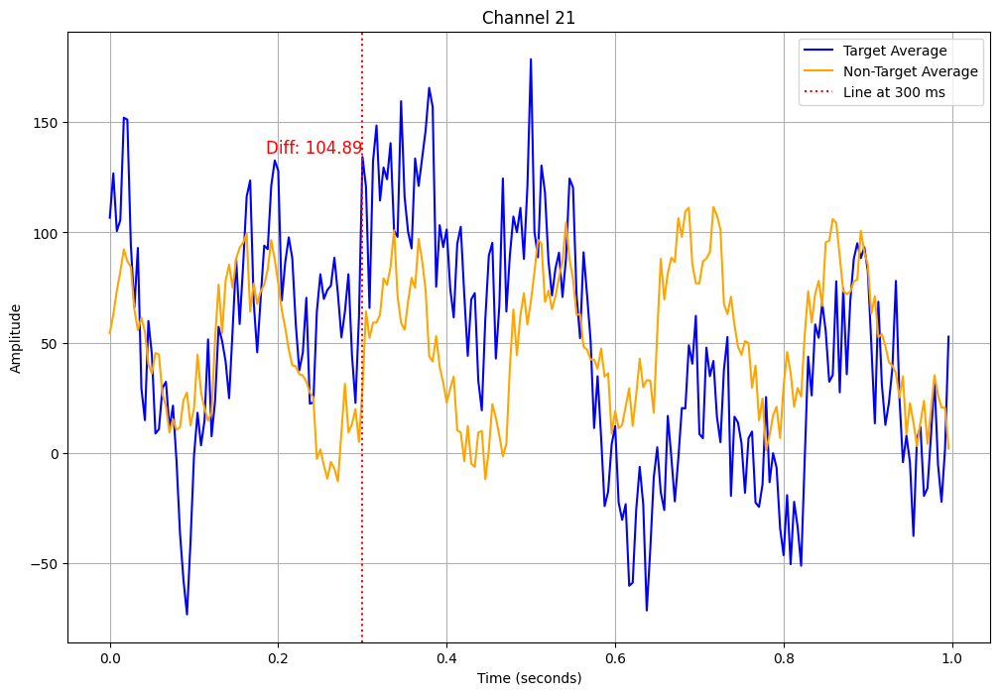

difference 104.8888888888889


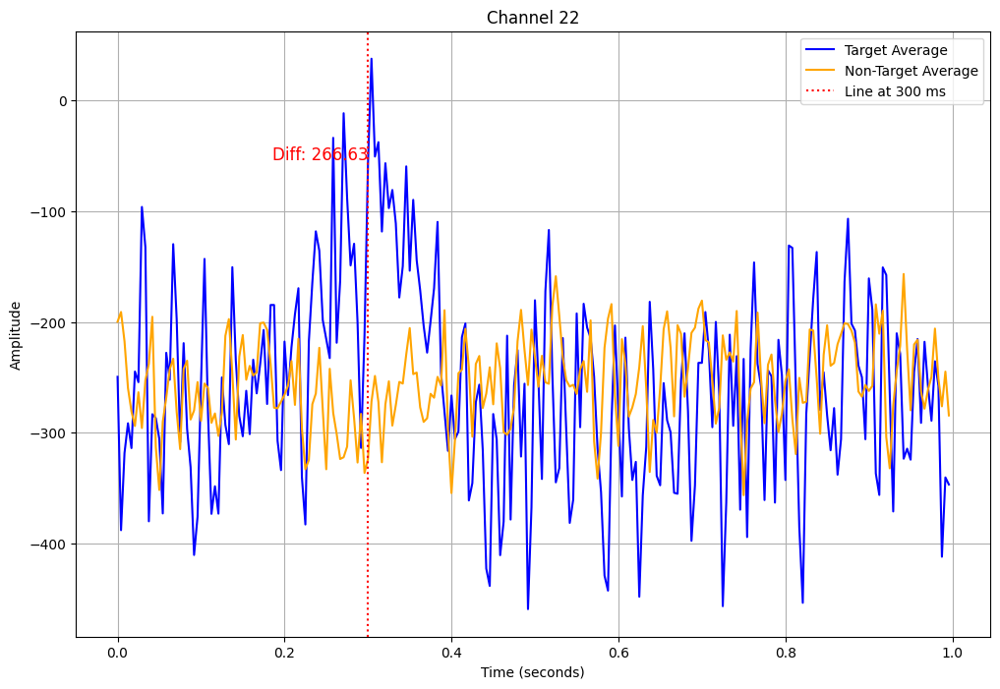

difference 266.63111111111107


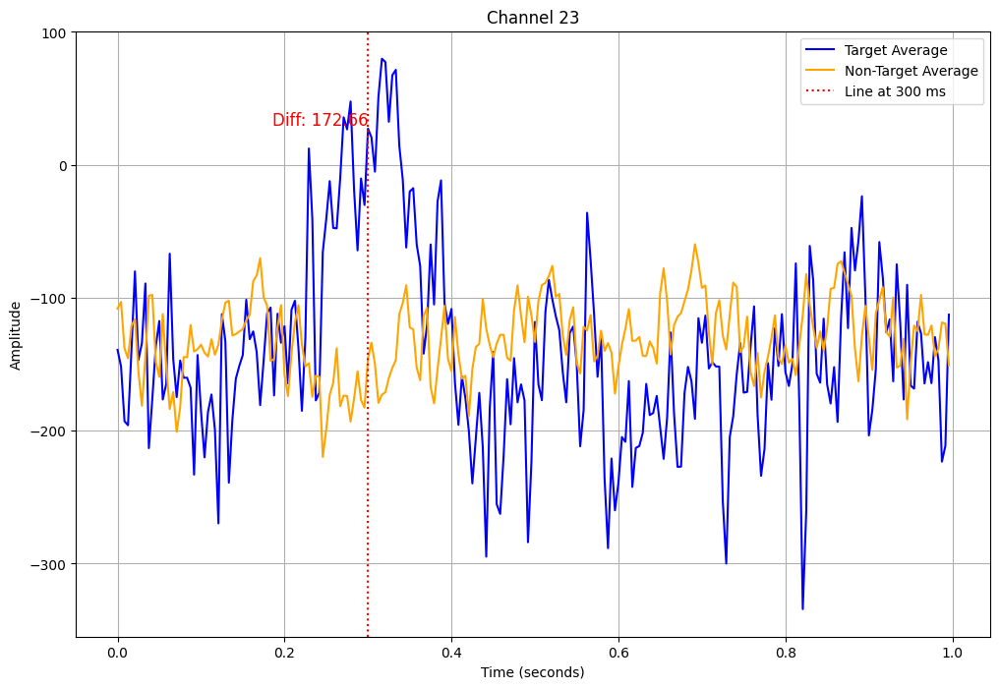

difference 172.65777777777777


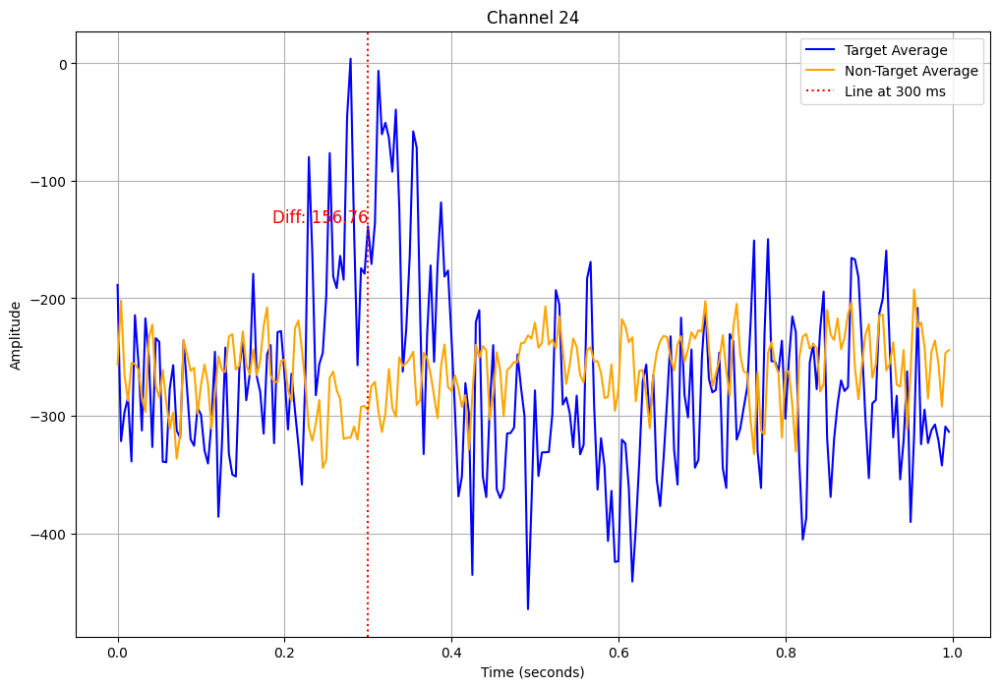

difference 156.76444444444445


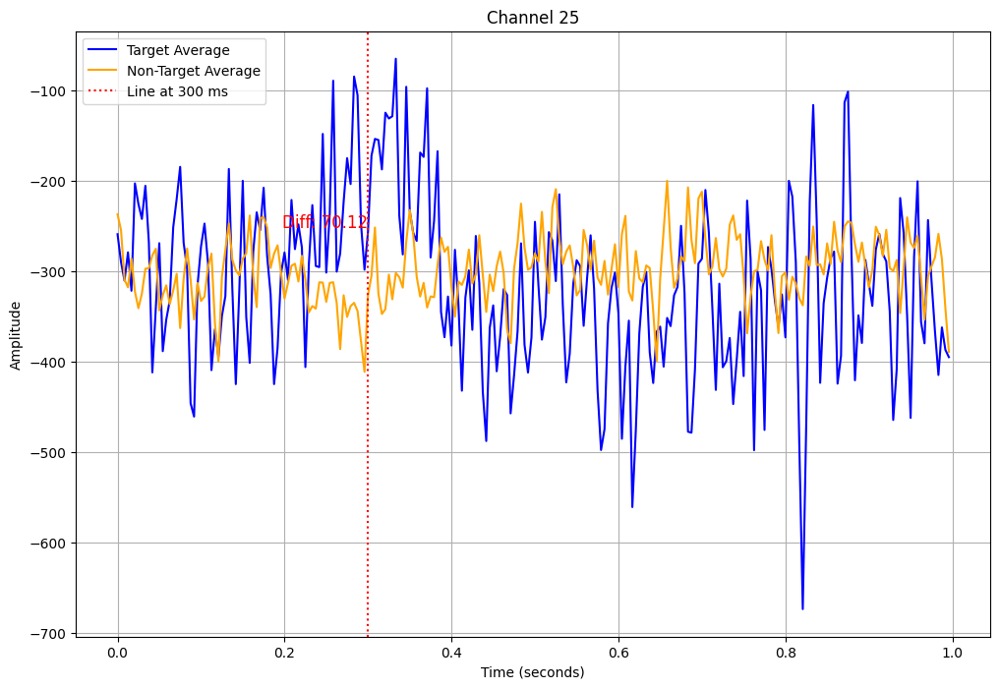

difference 70.11555555555555


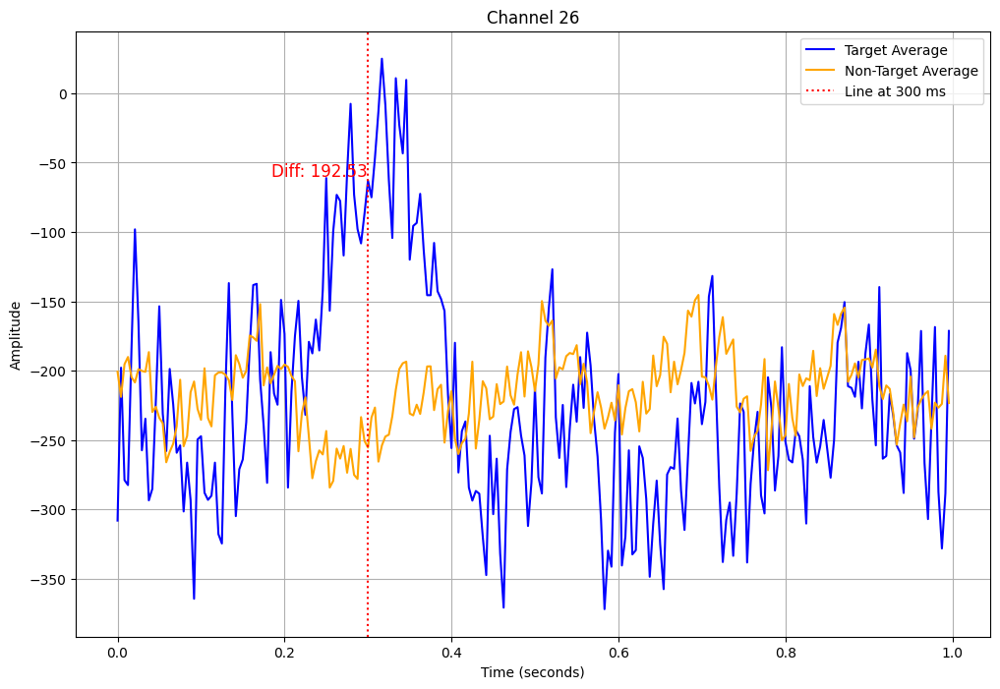

difference 192.53333333333333


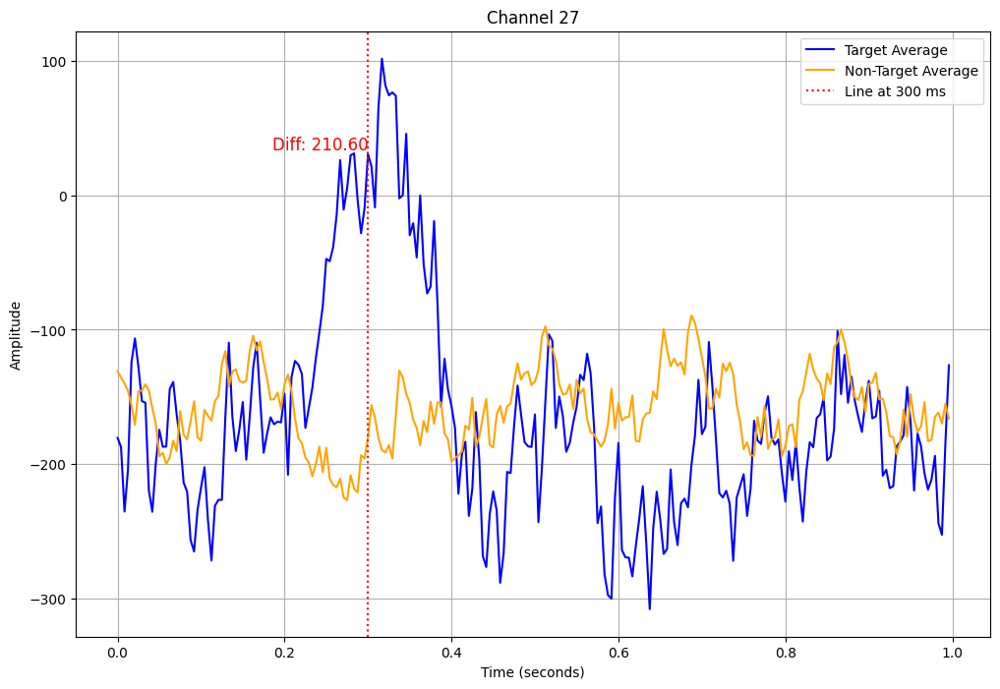

difference 210.59555555555556


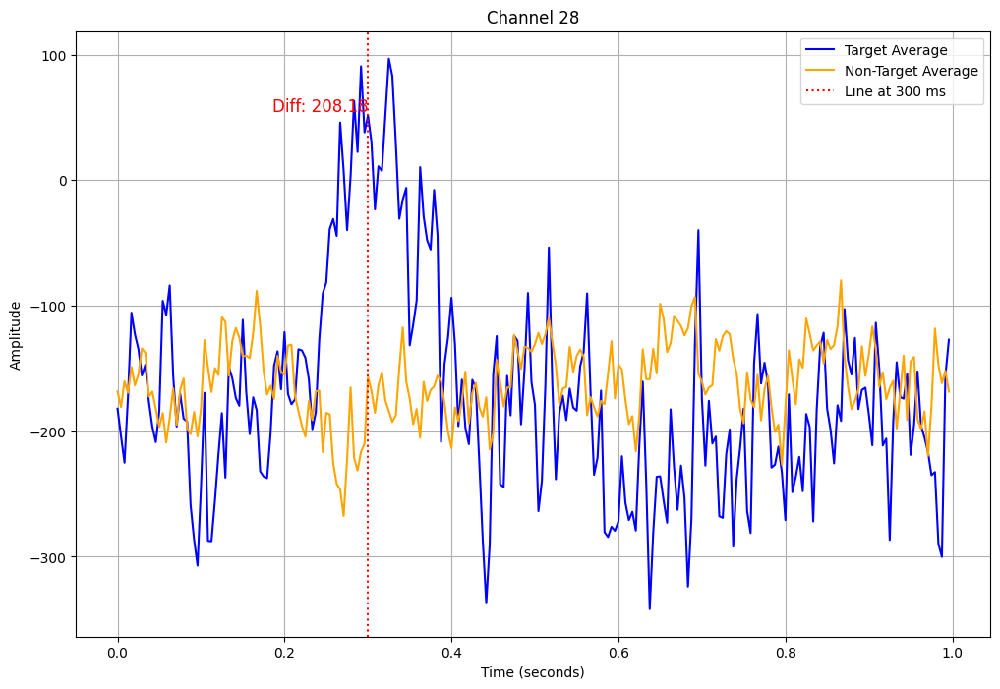

difference 208.1777777777778


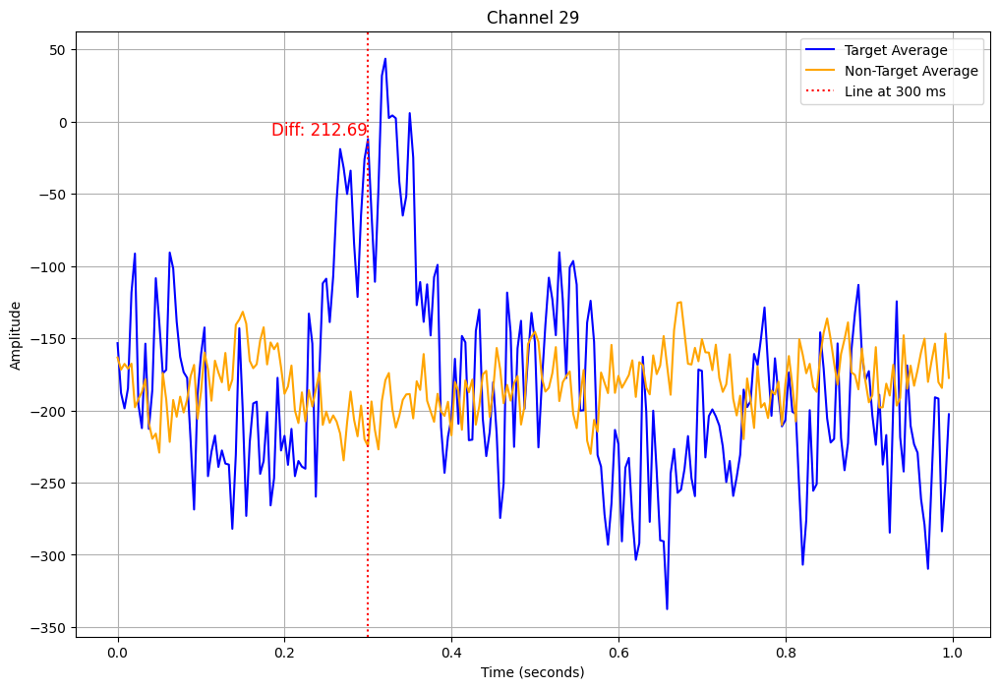

difference 212.69333333333333


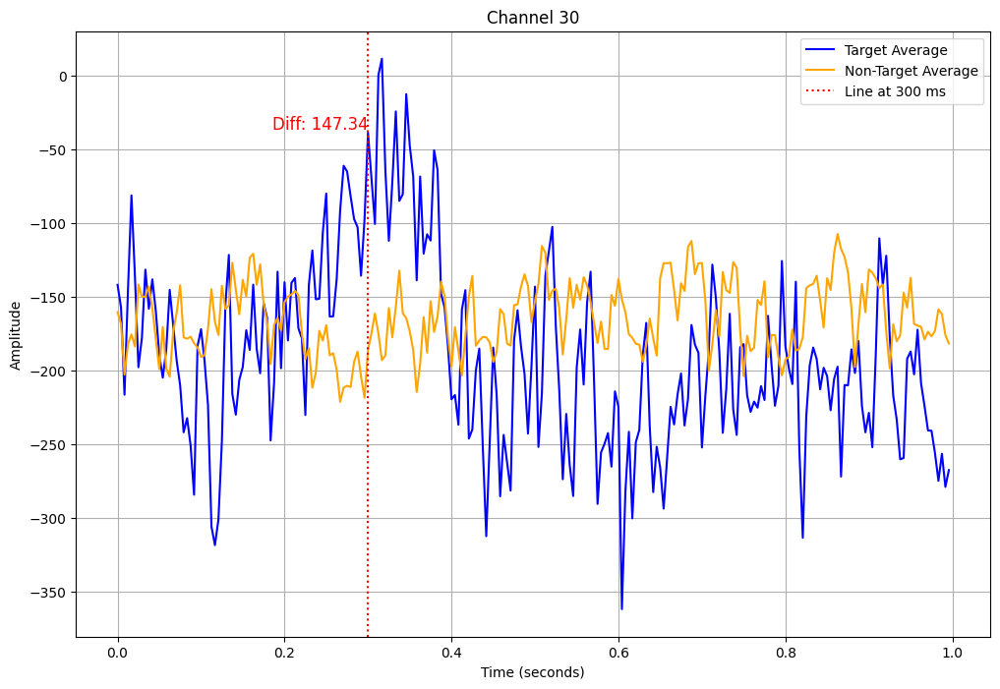

difference 147.3422222222222


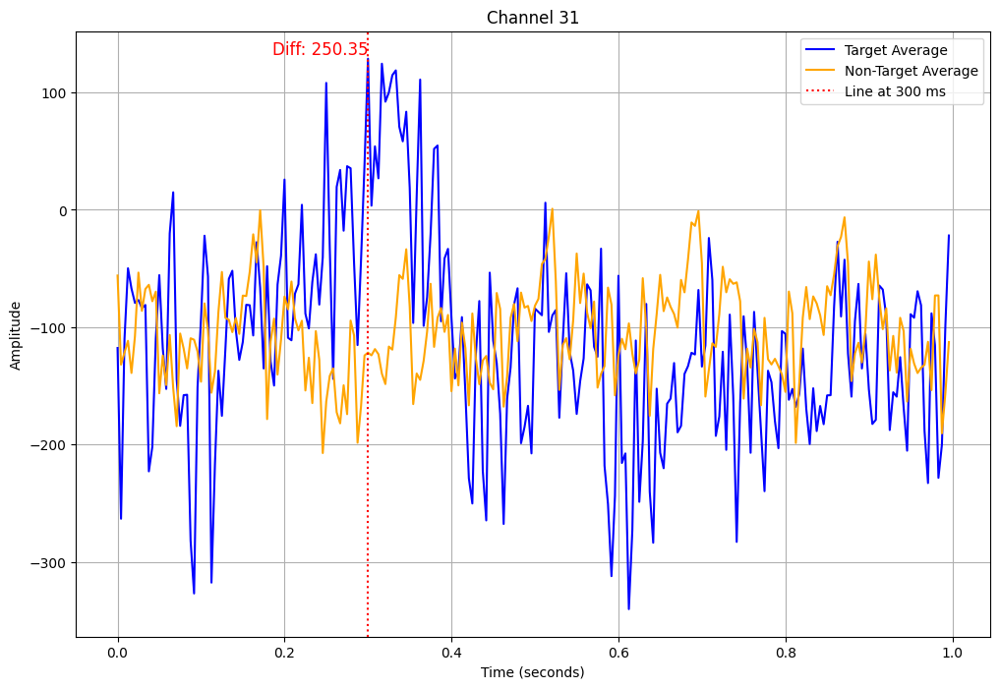

difference 250.34666666666666


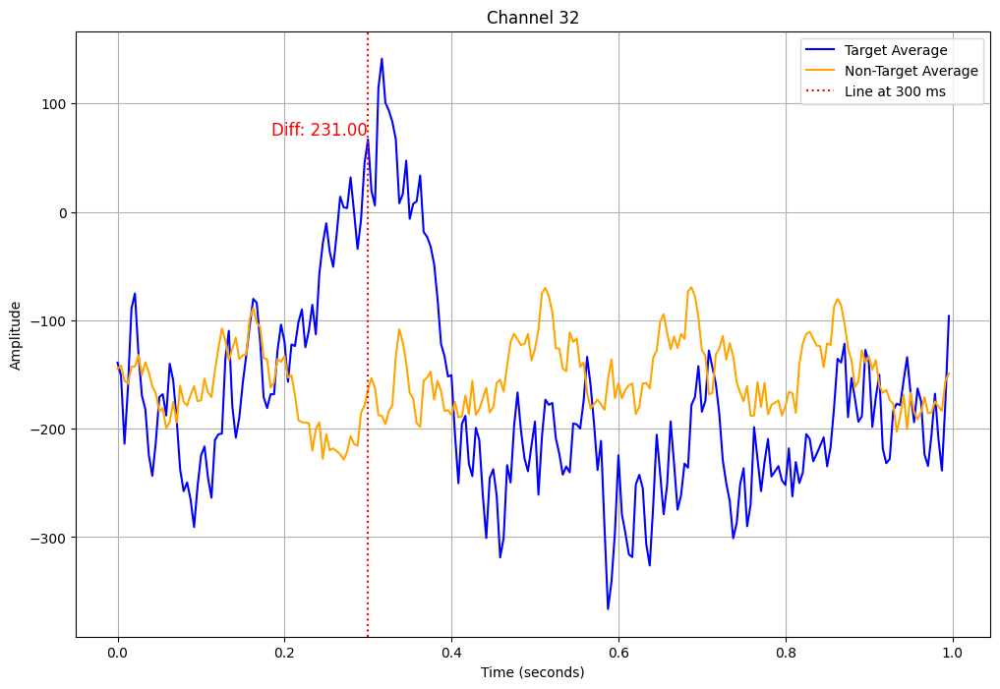

difference 231.00444444444446


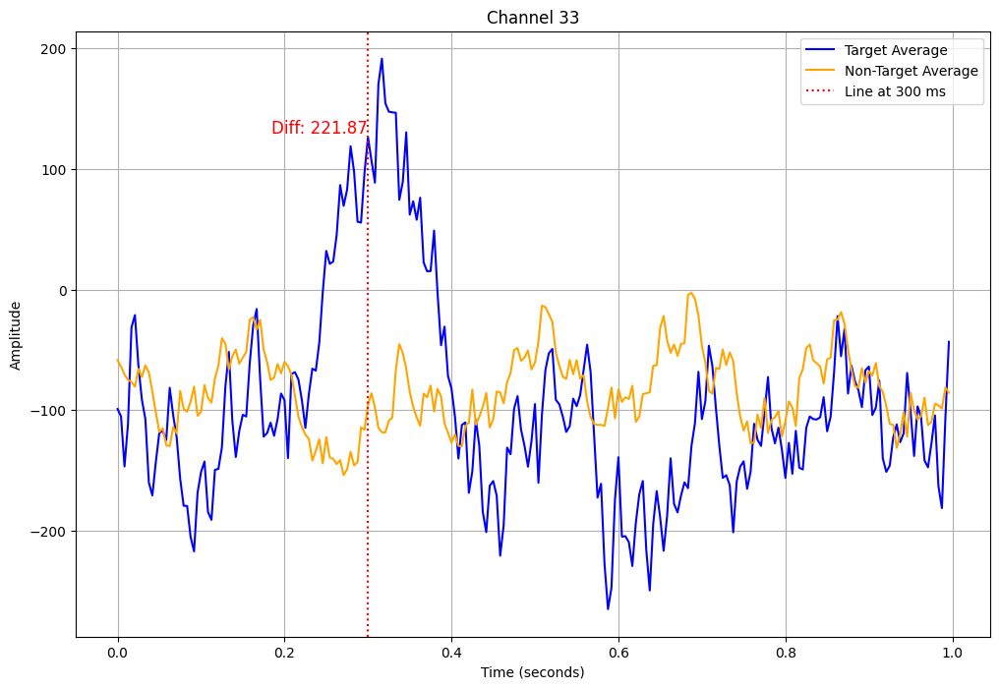

difference 221.86666666666667


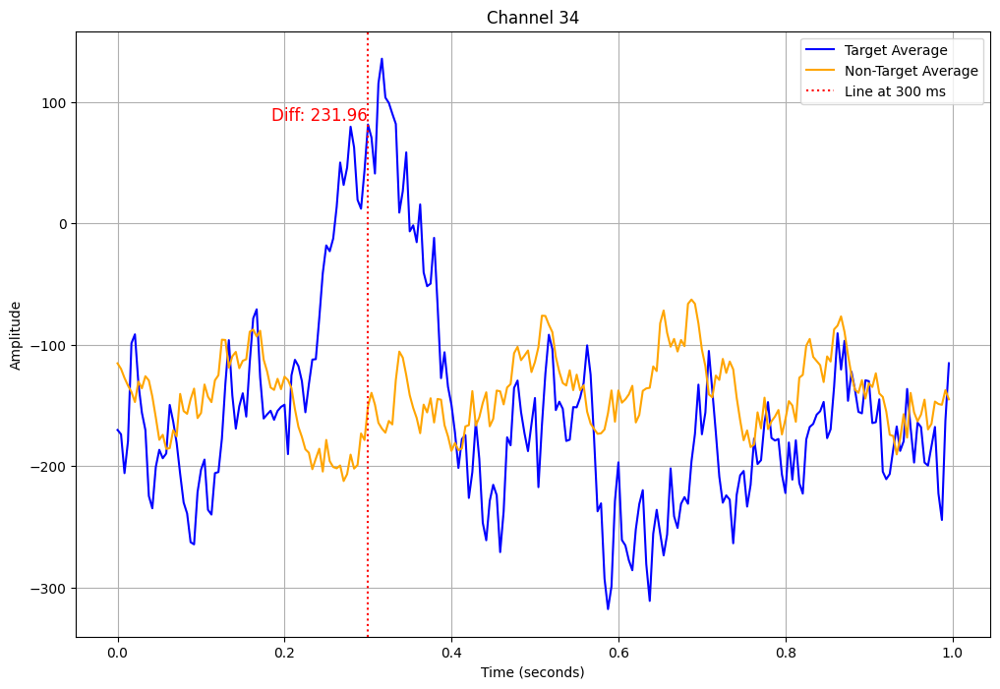

difference 231.96444444444444


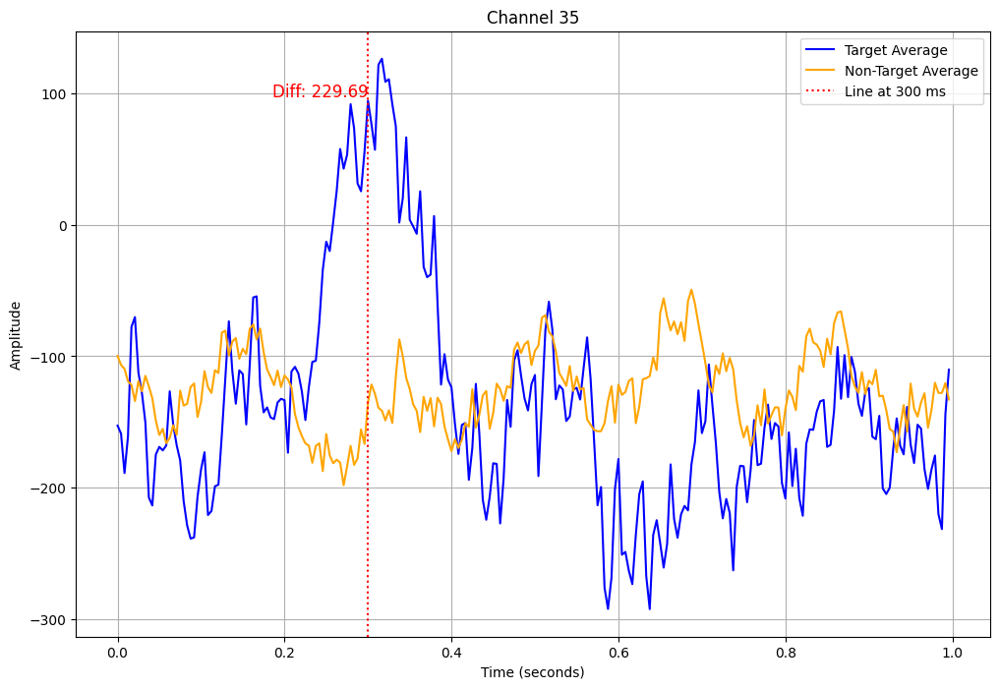

difference 229.6888888888889


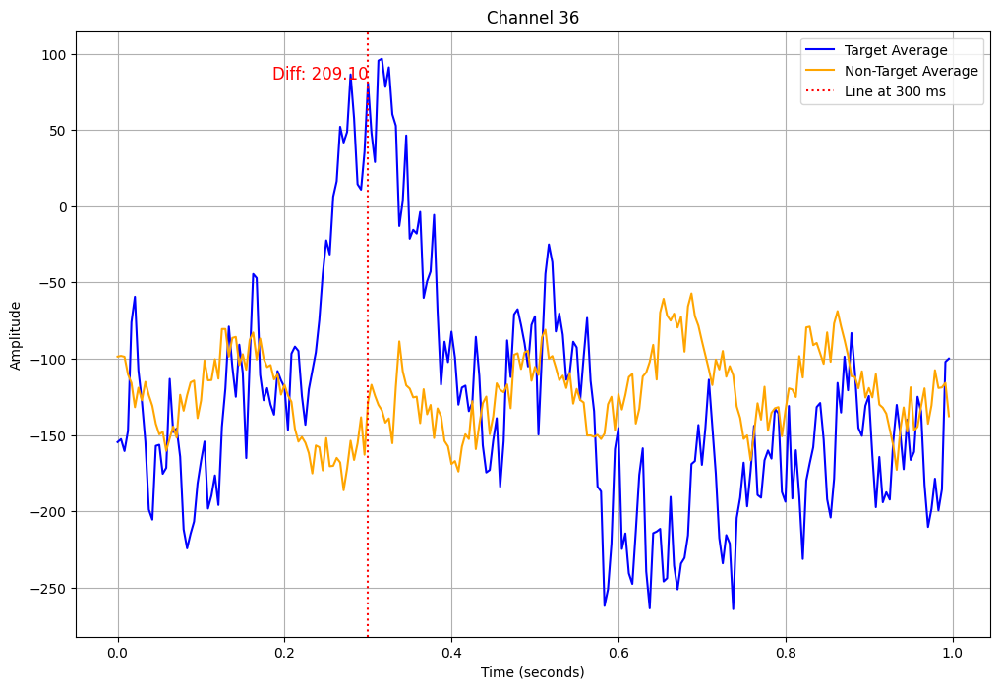

difference 209.10222222222222


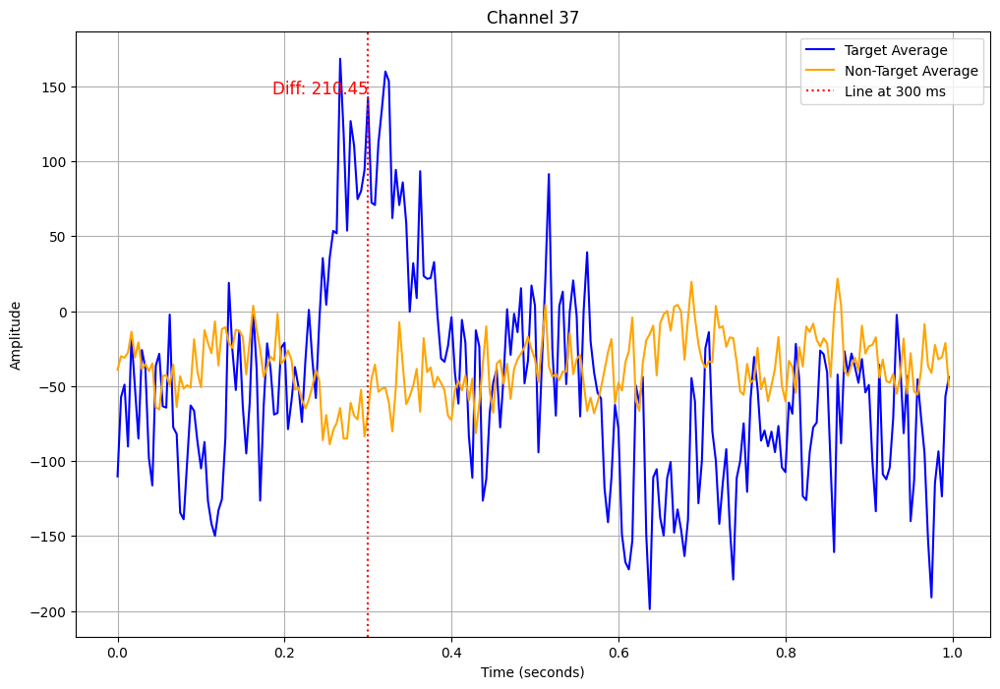

difference 210.45333333333332


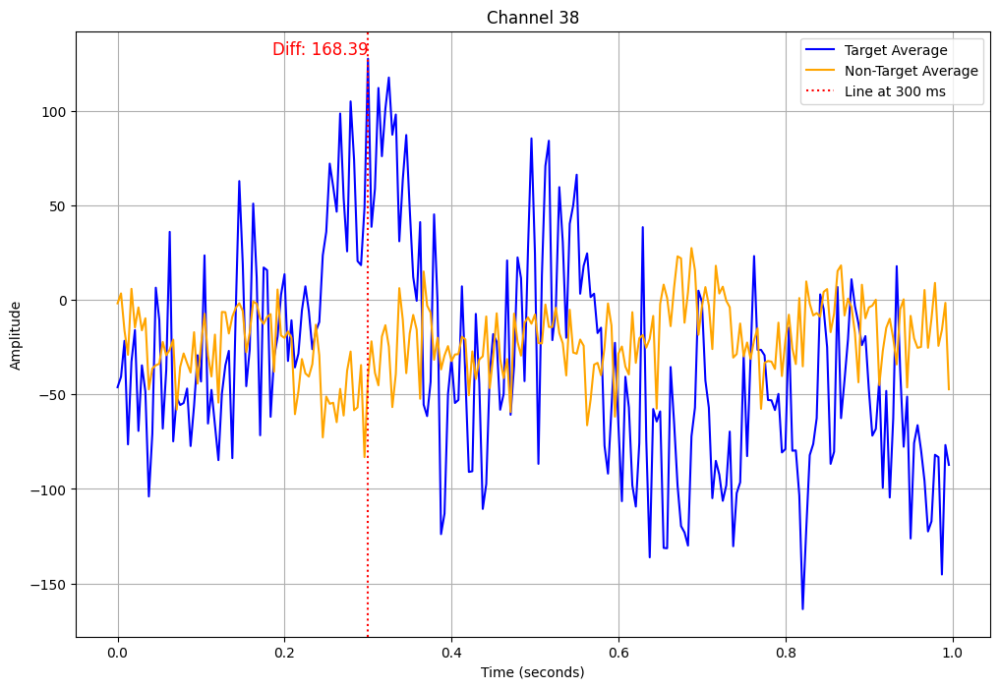

difference 168.39111111111112


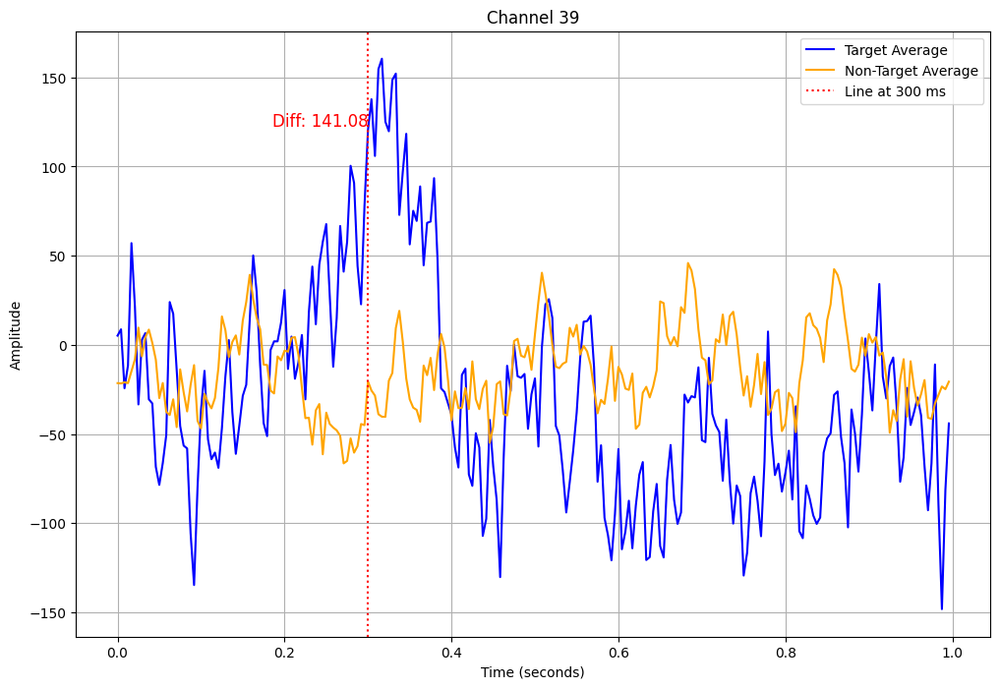

difference 141.08444444444444


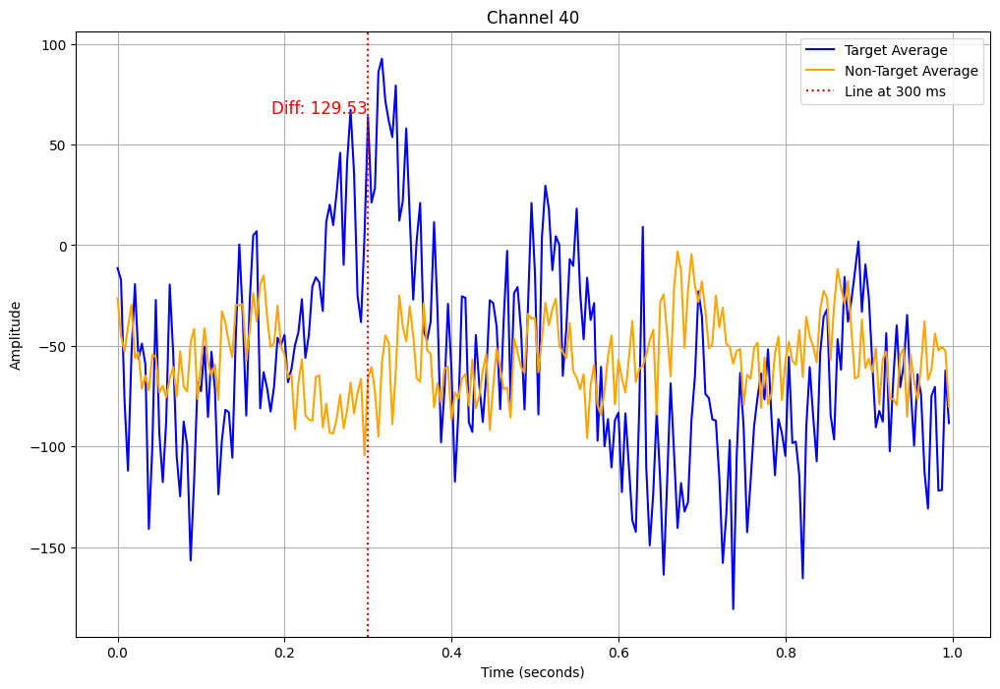

difference 129.5288888888889


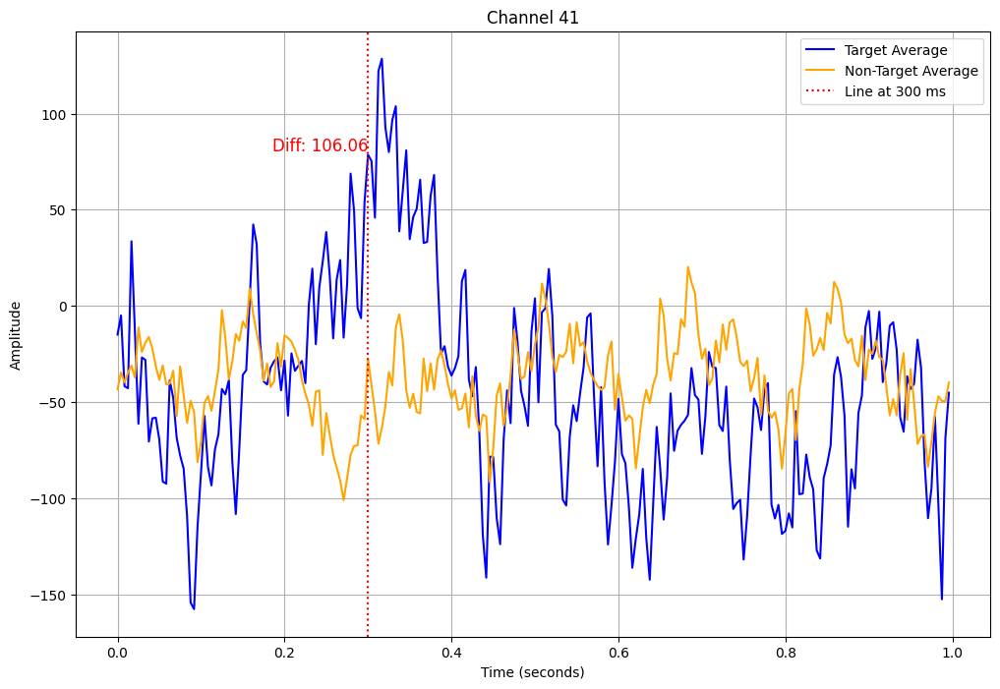

difference 106.06222222222223


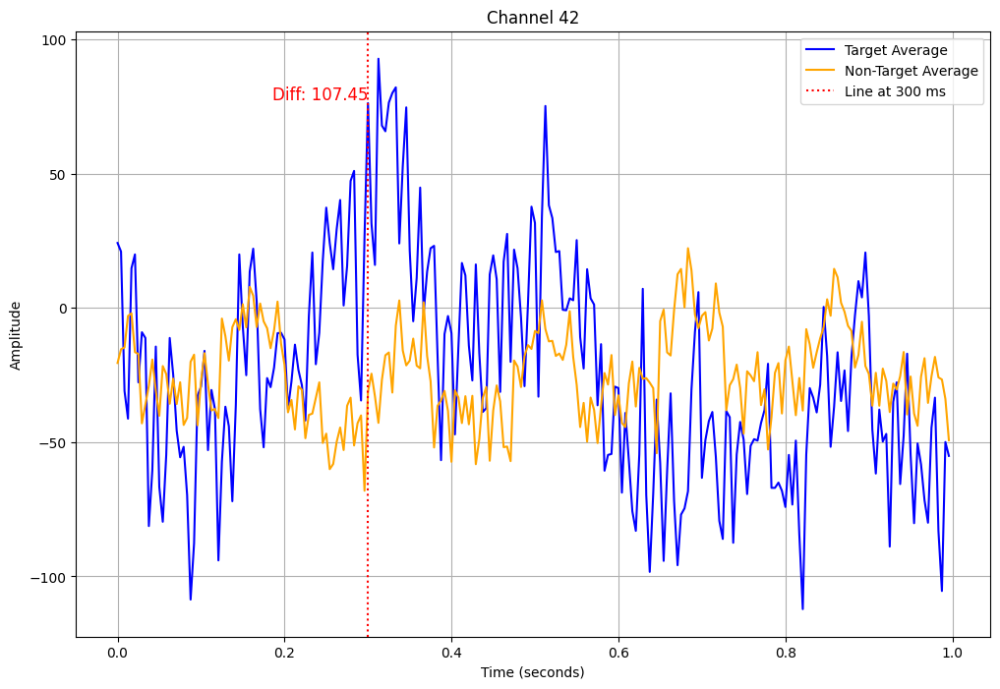

difference 107.44888888888889


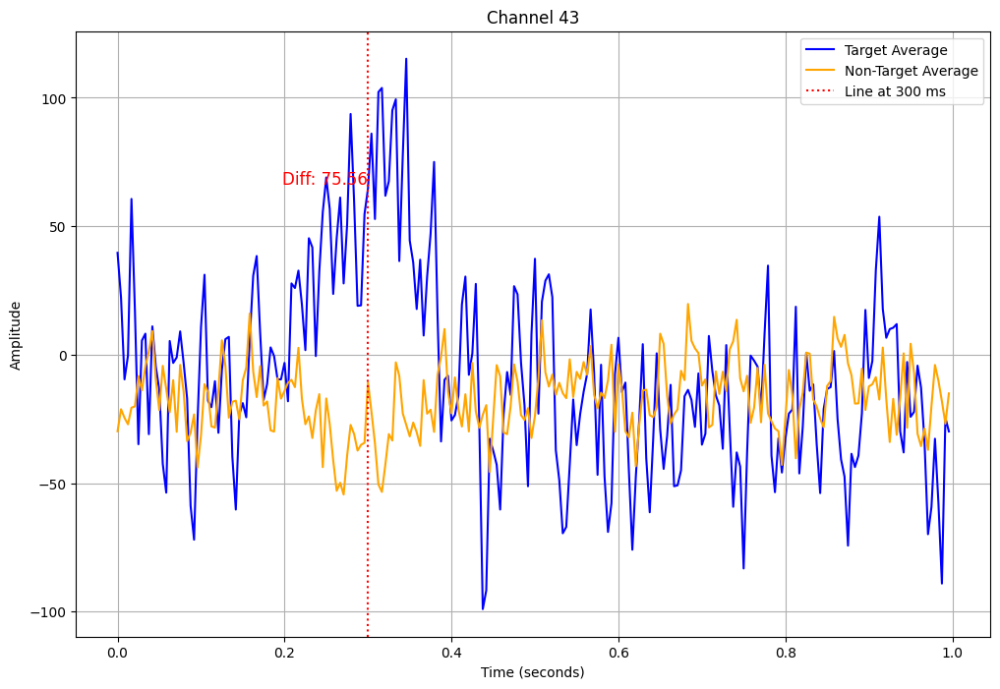

difference 75.55555555555556


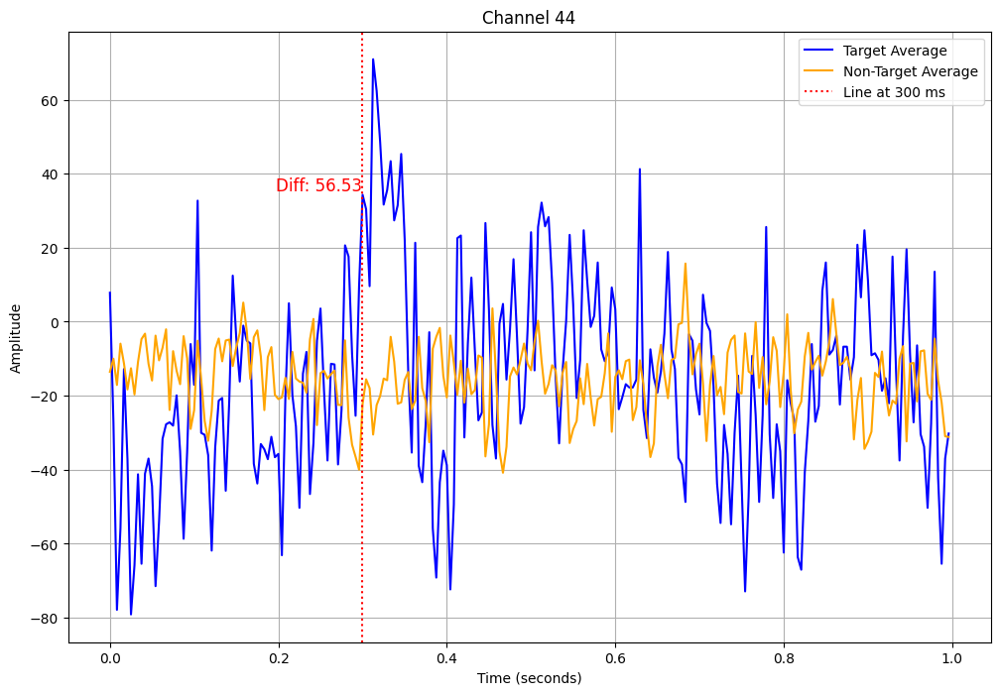

difference 56.53333333333333


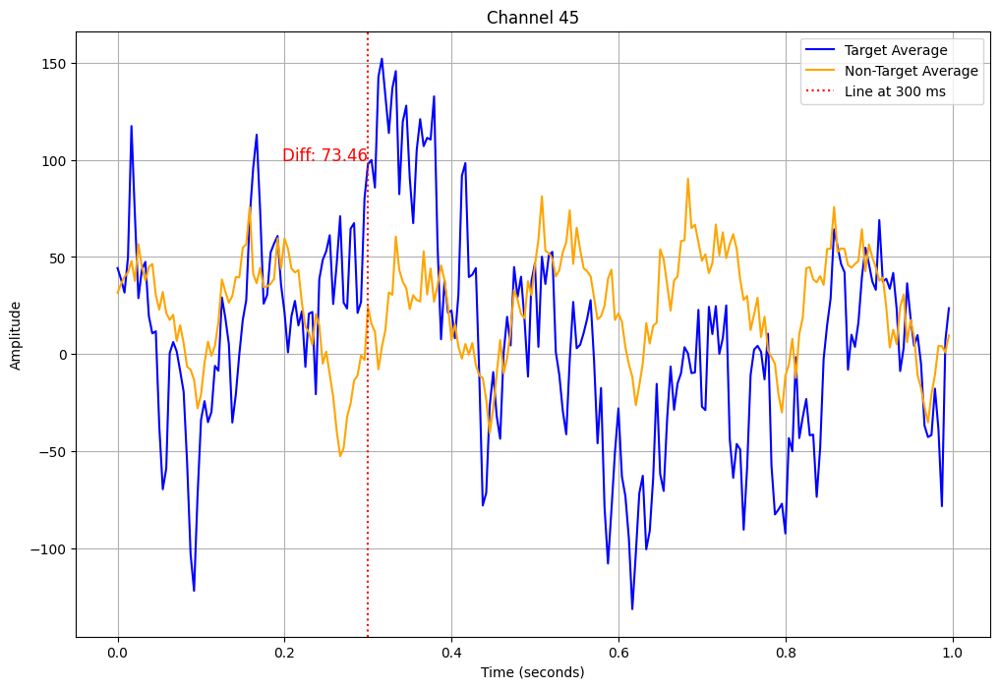

difference 73.45777777777778


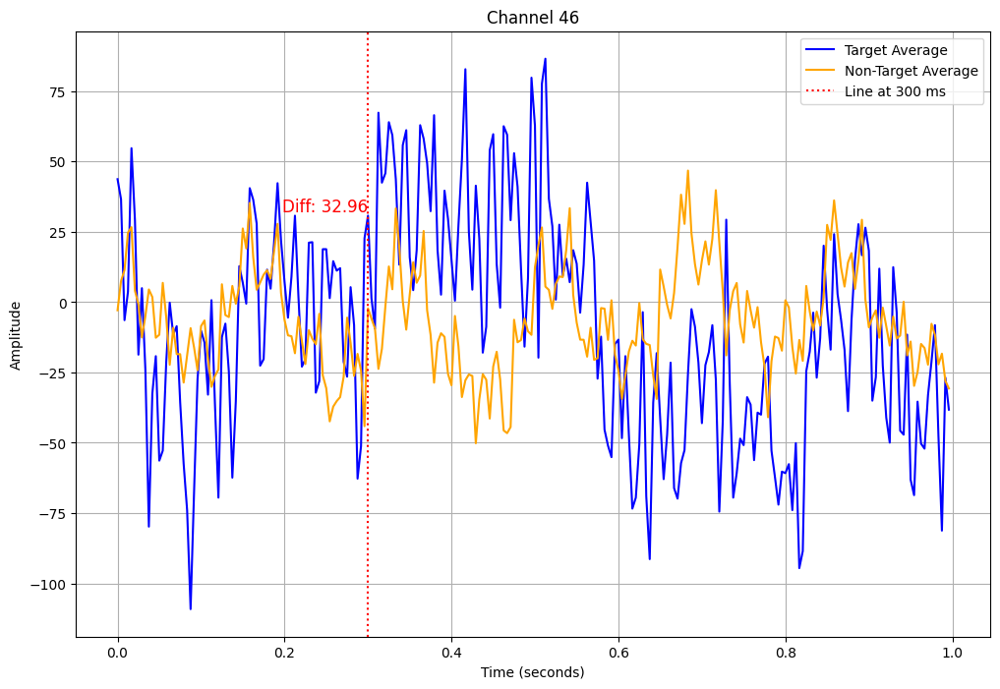

difference 32.96


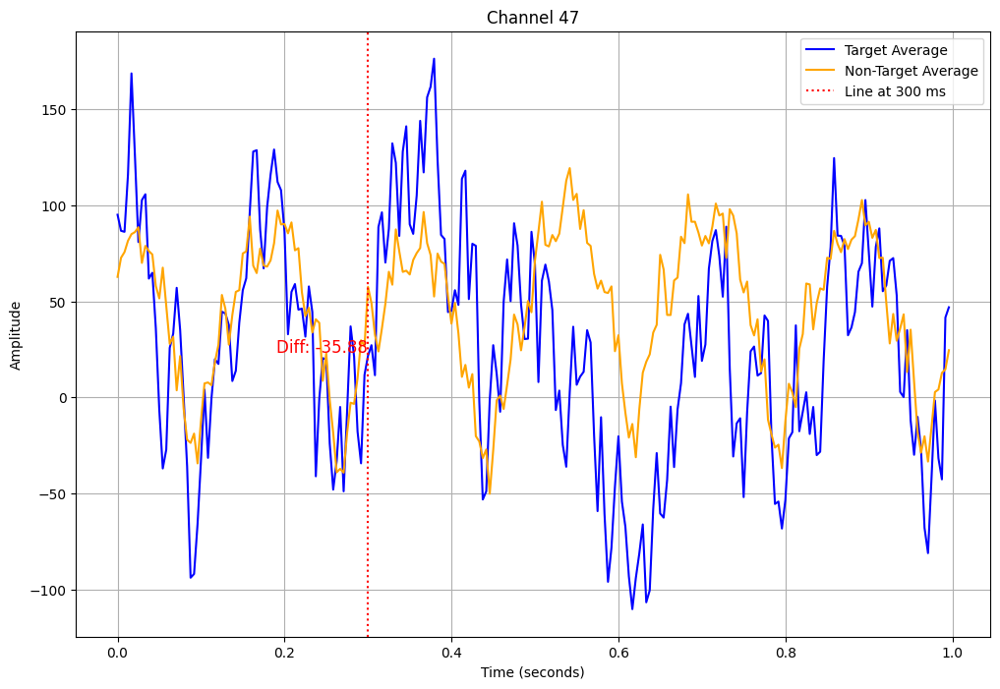

difference -35.87555555555556


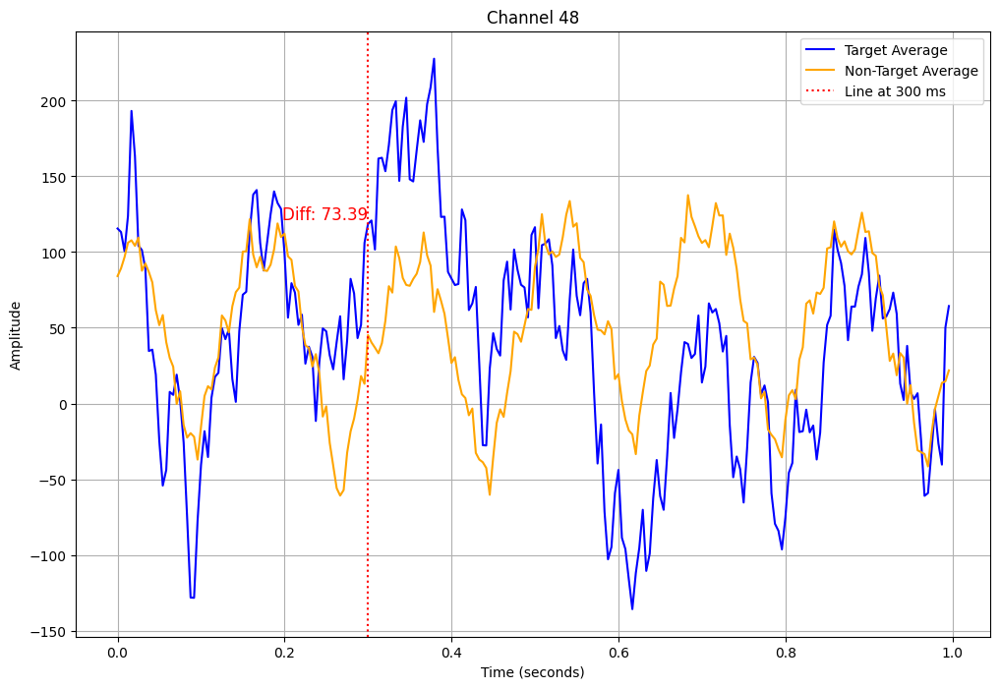

difference 73.38666666666667


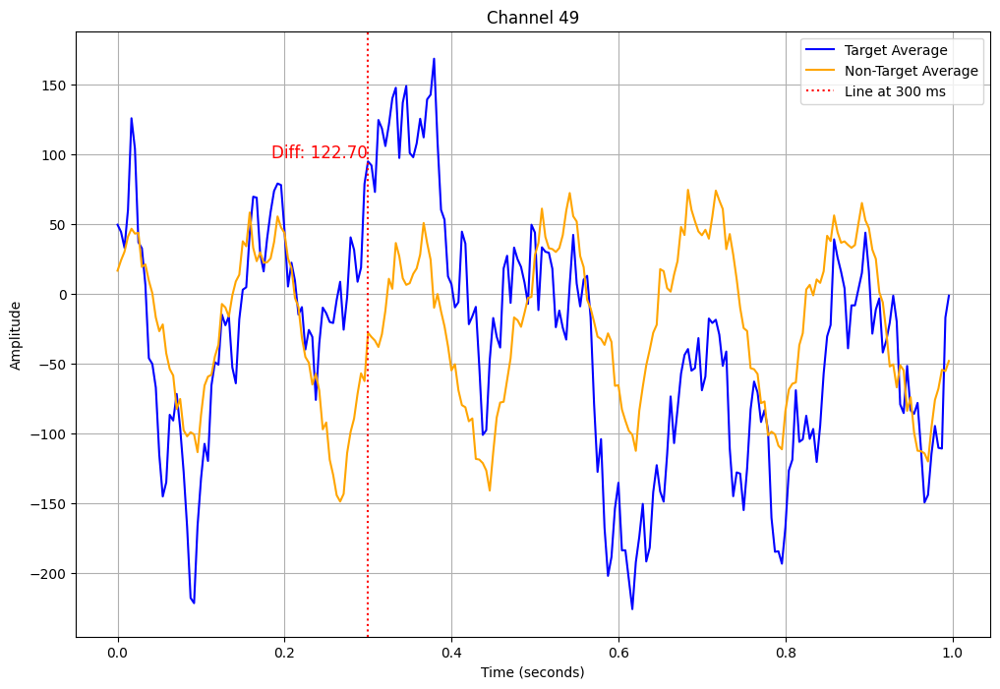

difference 122.70222222222222


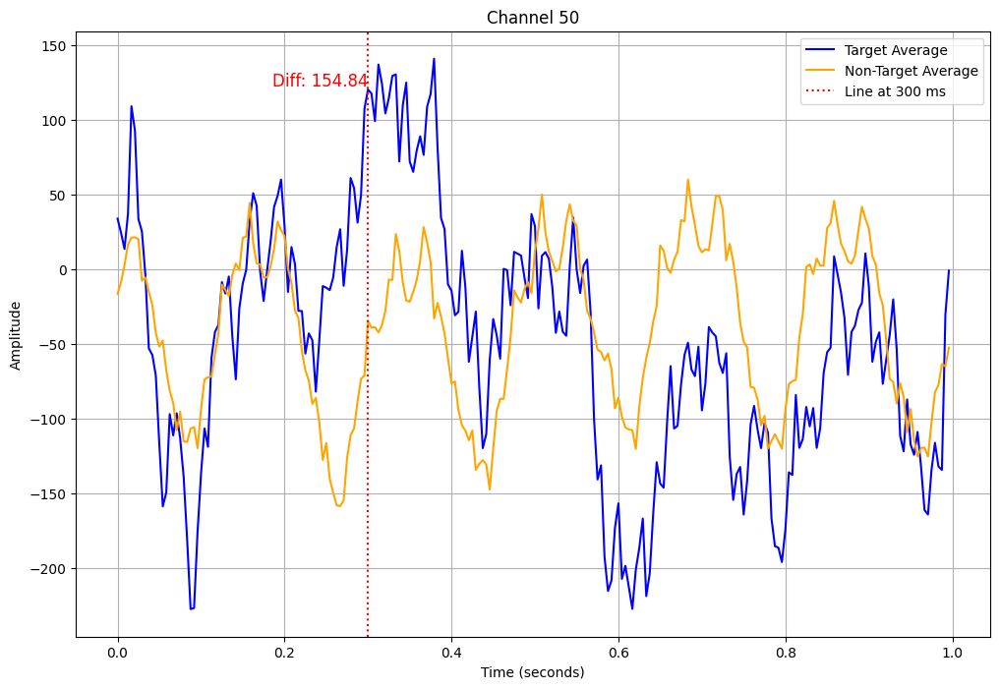

difference 154.84444444444443


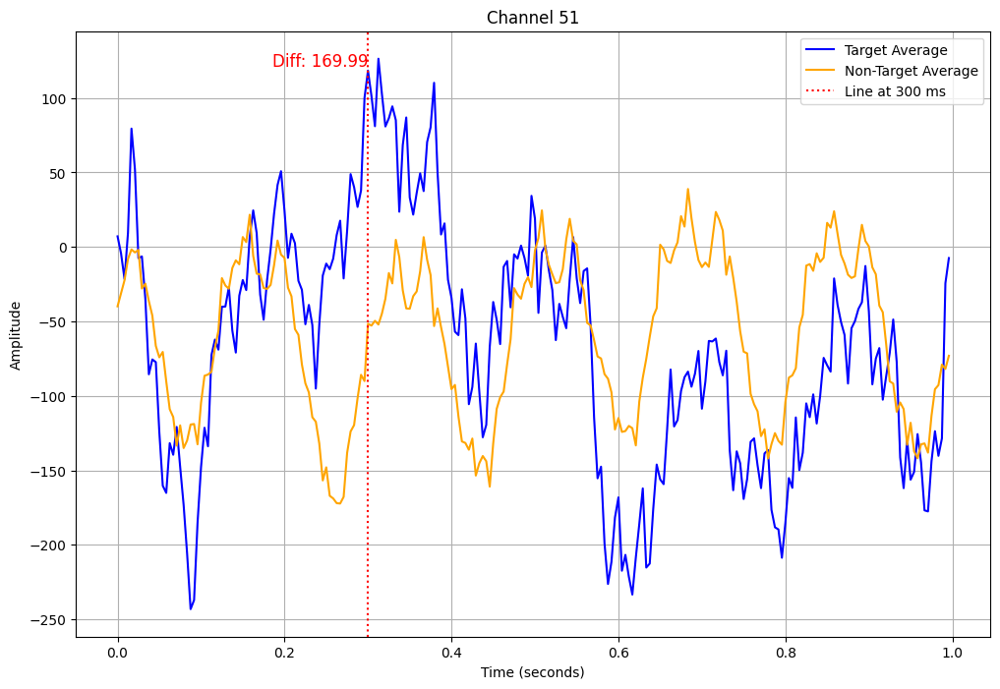

difference 169.9911111111111


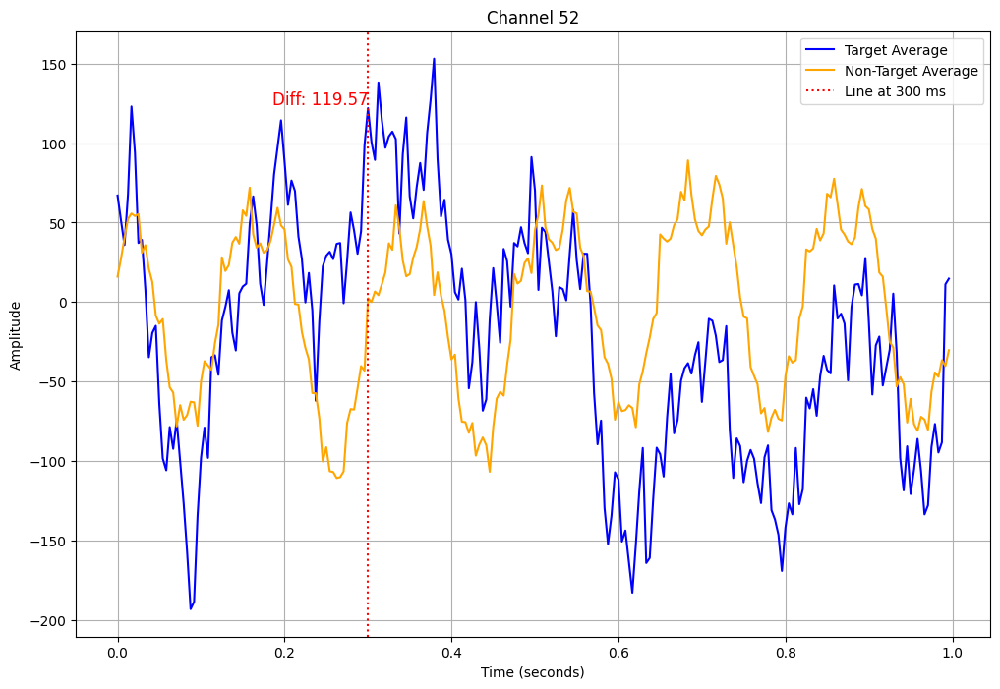

difference 119.57333333333332


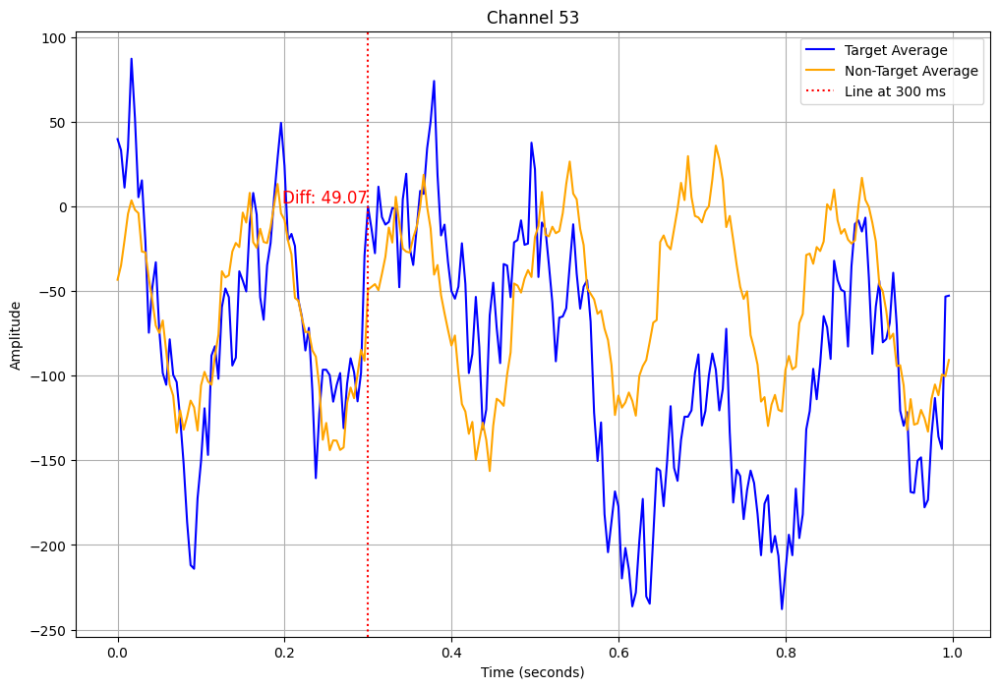

difference 49.06666666666667


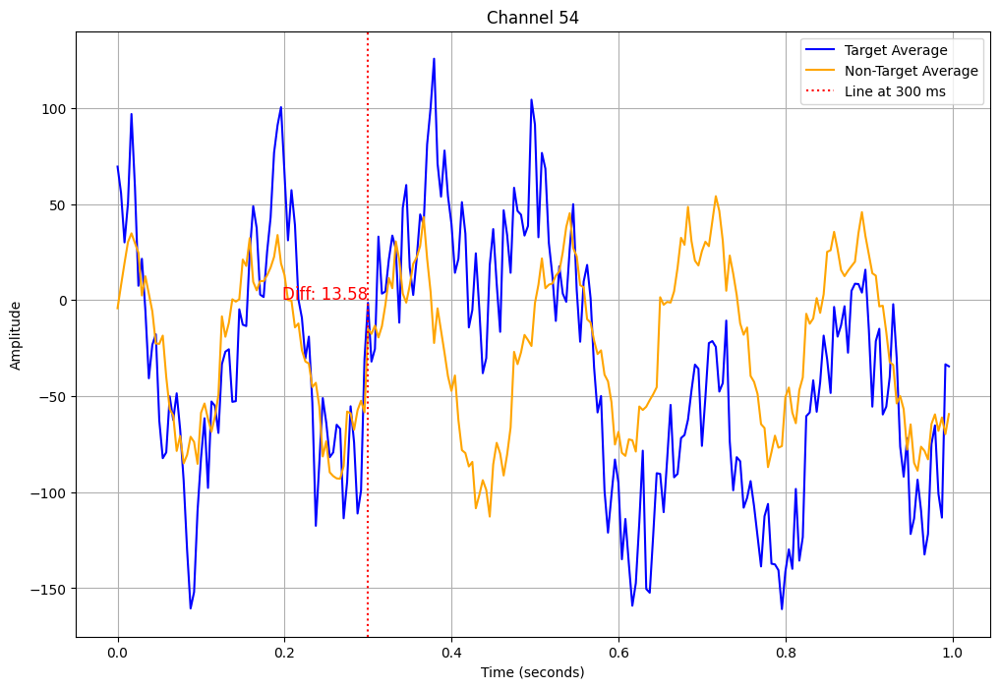

difference 13.582222222222223


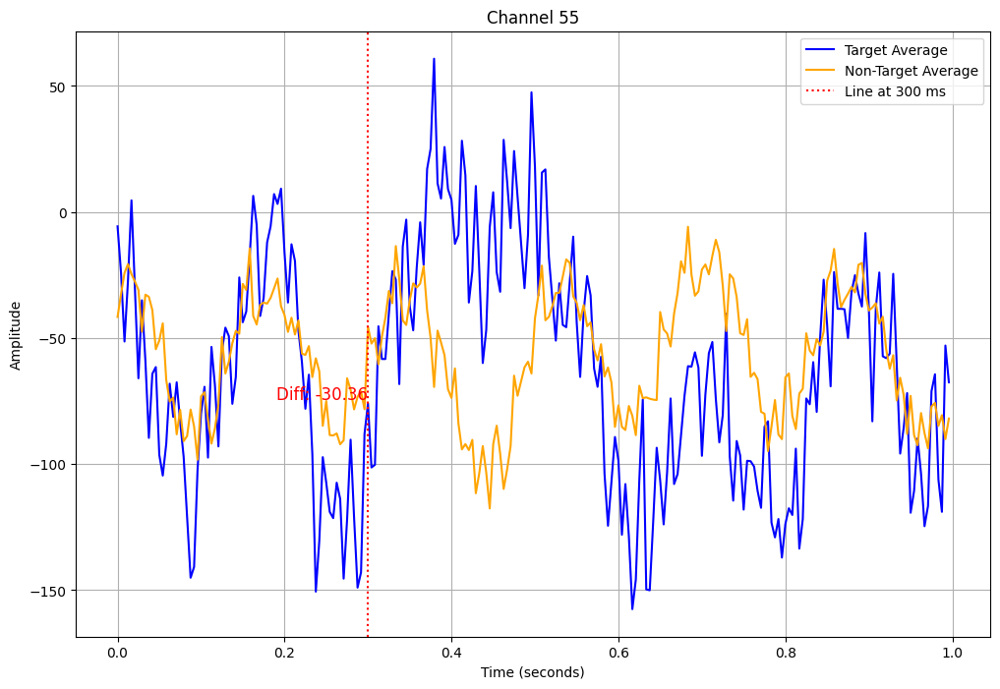

difference -30.364444444444445


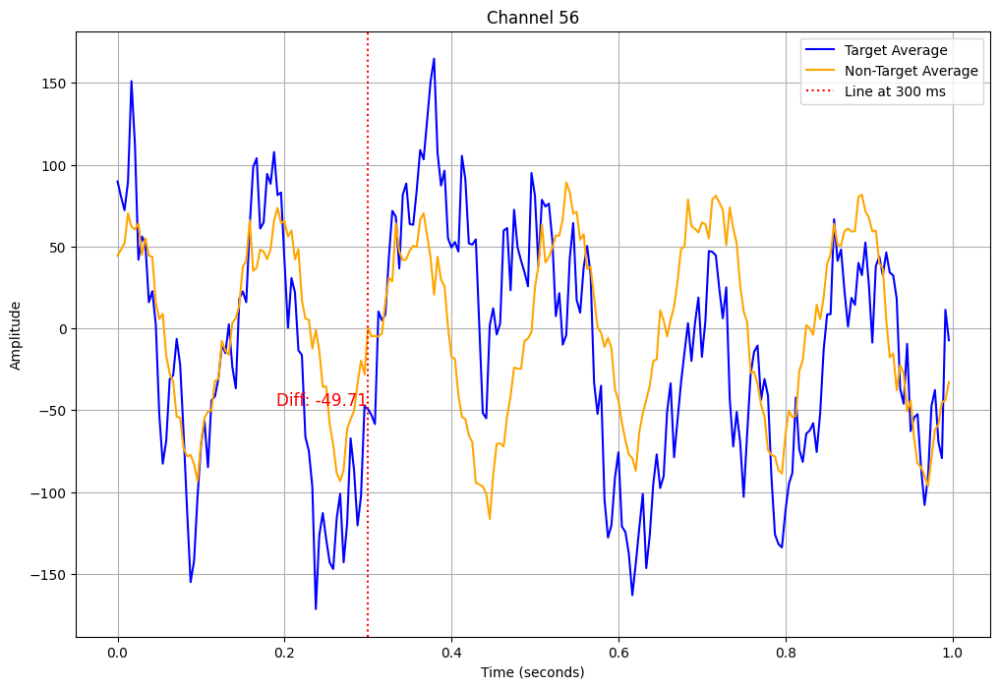

difference -49.70666666666667


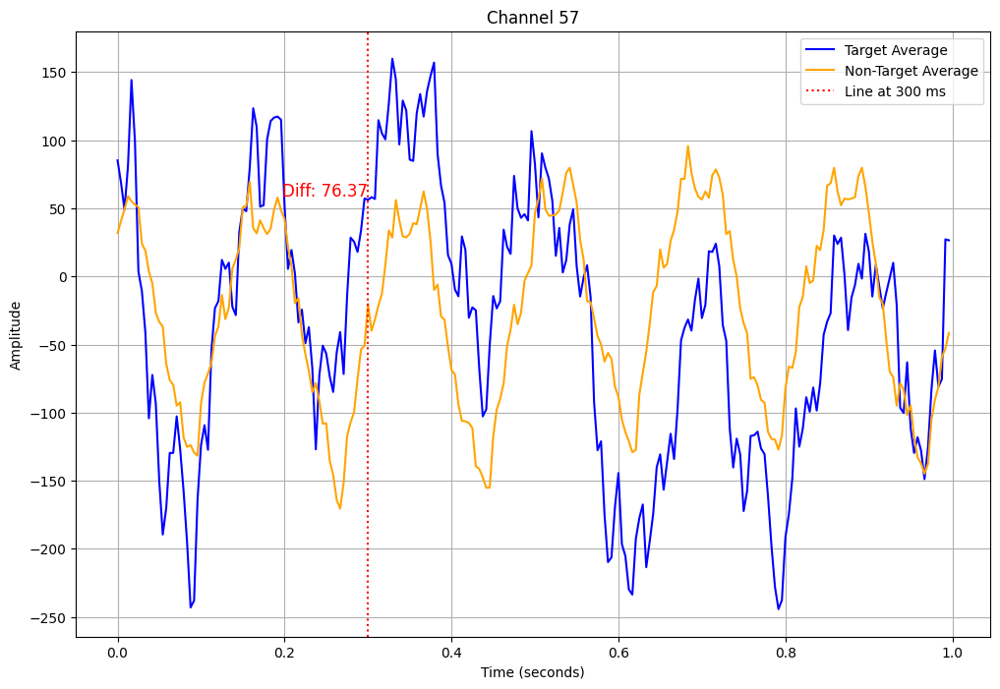

difference 76.37333333333333


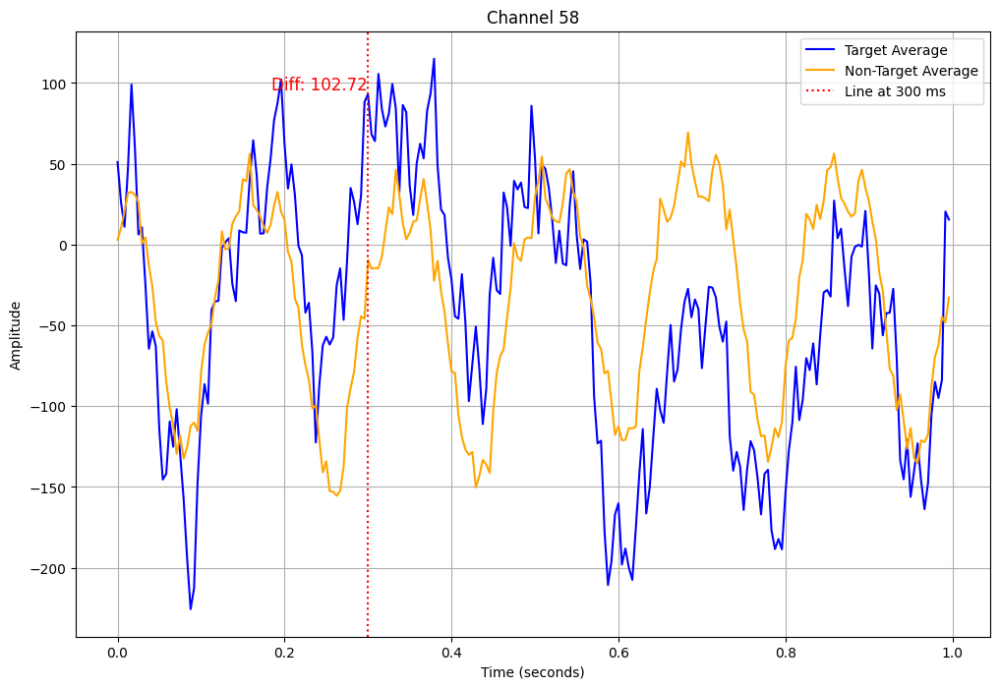

difference 102.72


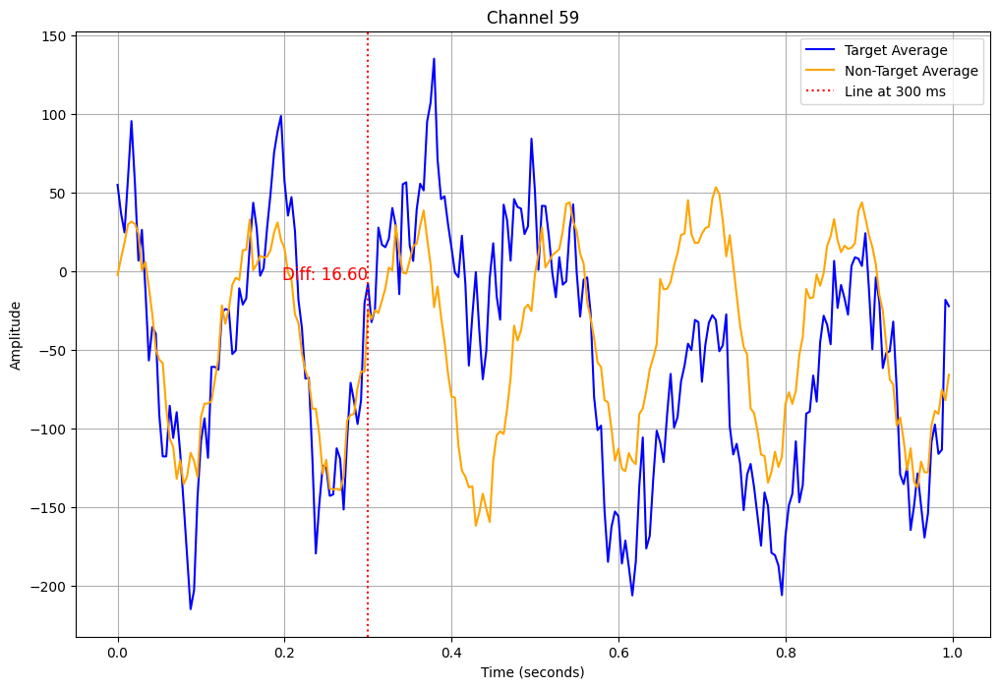

difference 16.604444444444443


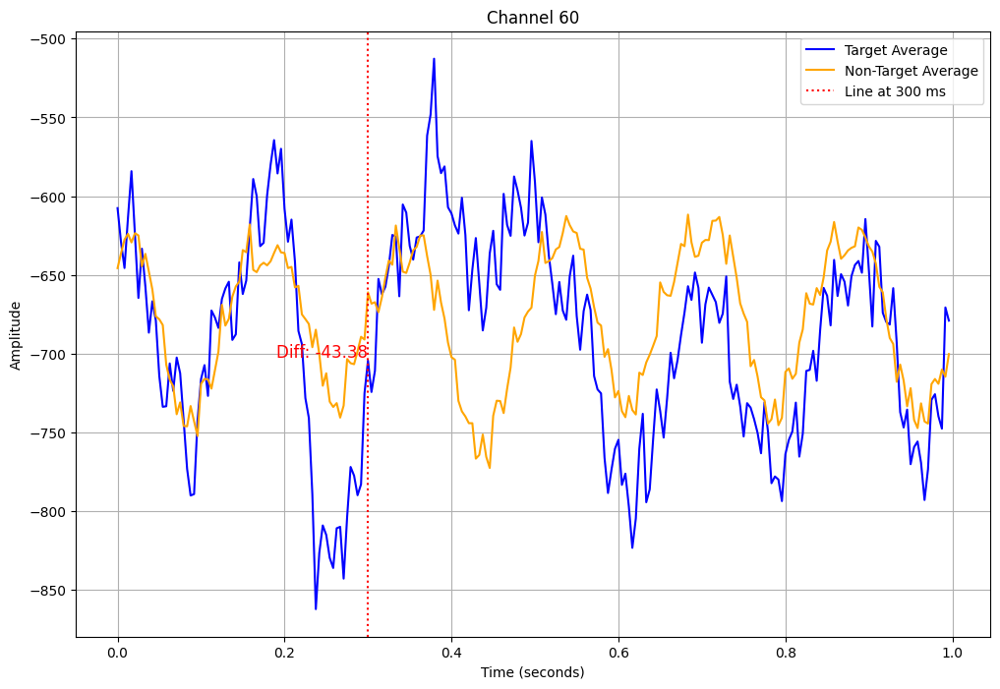

difference -43.37777777777774


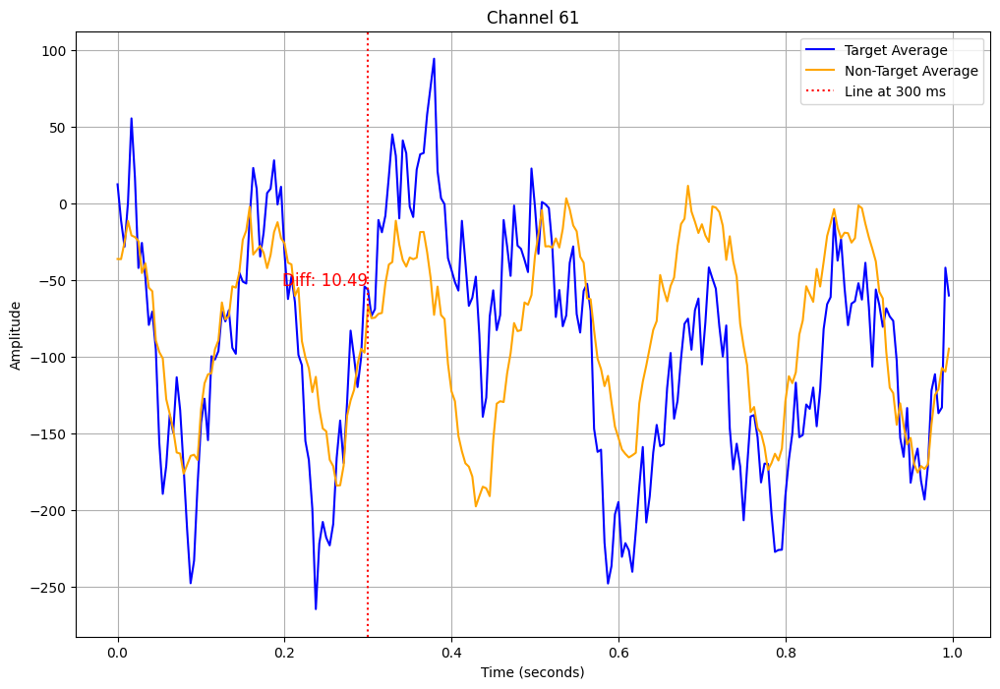

difference 10.488888888888894


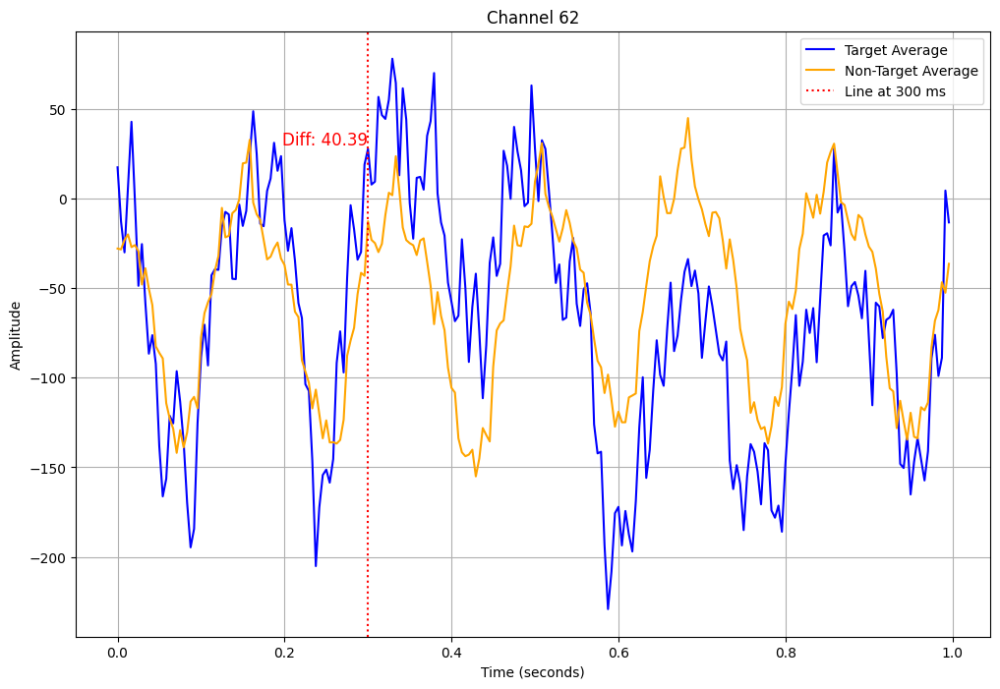

difference 40.391111111111115


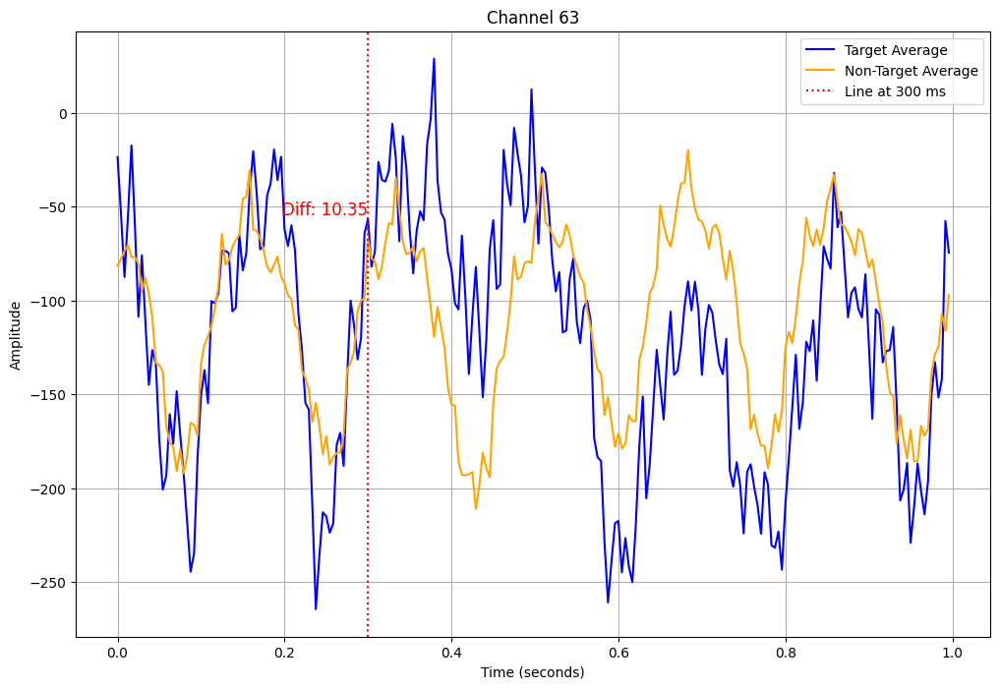

difference 10.346666666666664


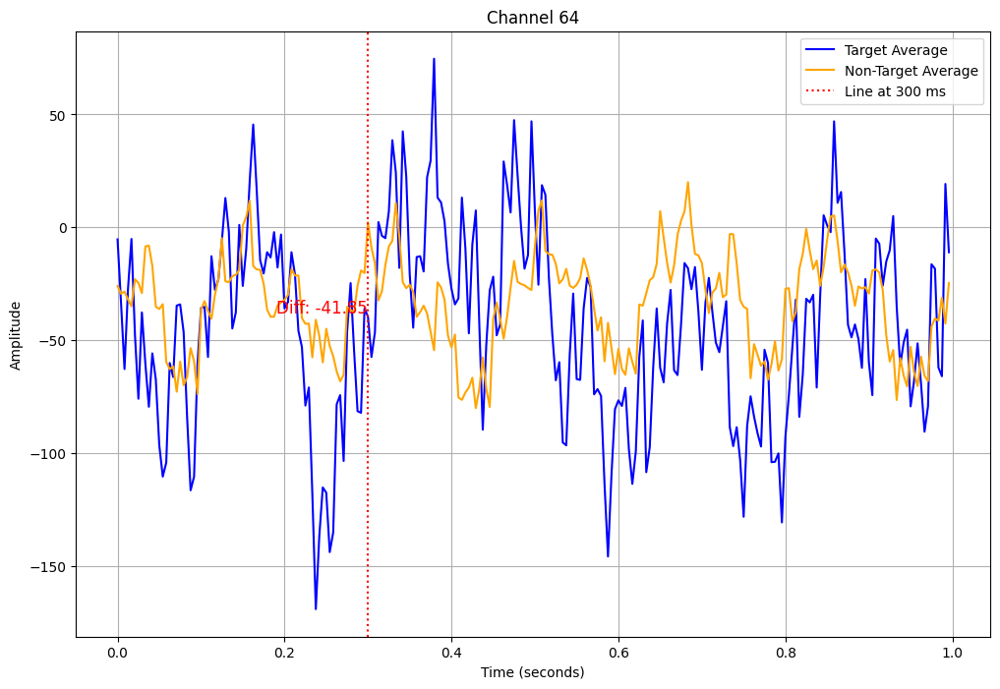

difference -41.848888888888894


In [52]:
import matplotlib.pyplot as plt

# List to store the differences for each channel
channel_differences = []

# Loop over each channel (0 to 63)
for i in range(64):
    ch_signal = signal[:, i]  # Assuming signal has shape (64, signal_length), and you are selecting the i-th channel
    target_clips = extract_clippets(ch_signal, target_start_indices)
    nontarget_clips = extract_clippets(ch_signal, nontarget_start_indices)

    # Get the difference for each channel
    diff = plot_average_clips_with_difference(target_clips, nontarget_clips, title='Channel ' + str(i+1))
    
    # Append the difference at t = 0.3 to the list
    channel_differences.append(diff)

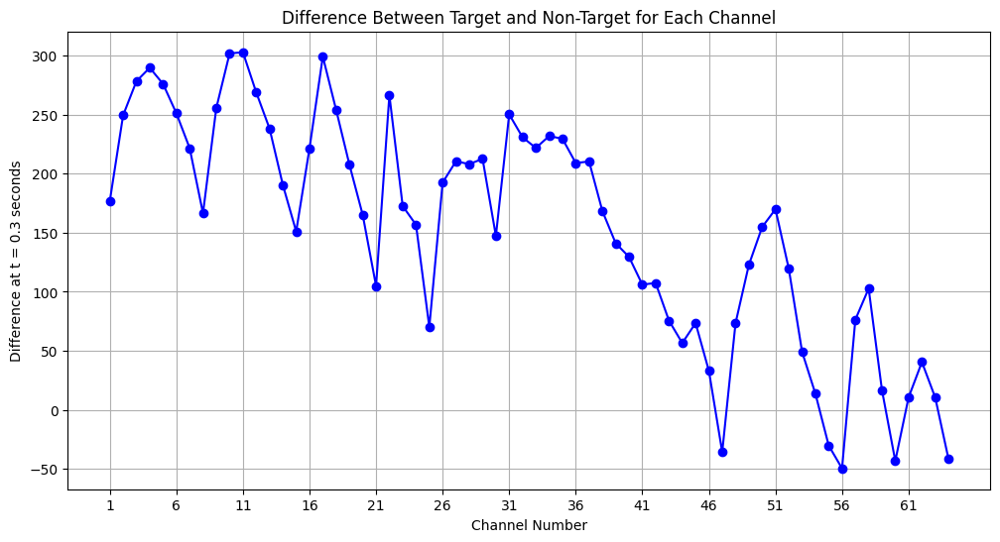

In [54]:
# Now plot the differences across all channels
plt.figure(figsize=(12, 6))
plt.plot(range(1, 65), channel_differences, marker='o', color='b')
plt.title('Difference Between Target and Non-Target for Each Channel')
plt.xlabel('Channel Number')
plt.ylabel('Difference at t = 0.3 seconds')
plt.grid(True)
plt.xticks(range(1, 65, 5))  # Display every 5th channel for readability
plt.show()

### Section 3

Shape of all clips: (540, 240)
Shape of all labels: (540, 1)
Shape of scores: 540


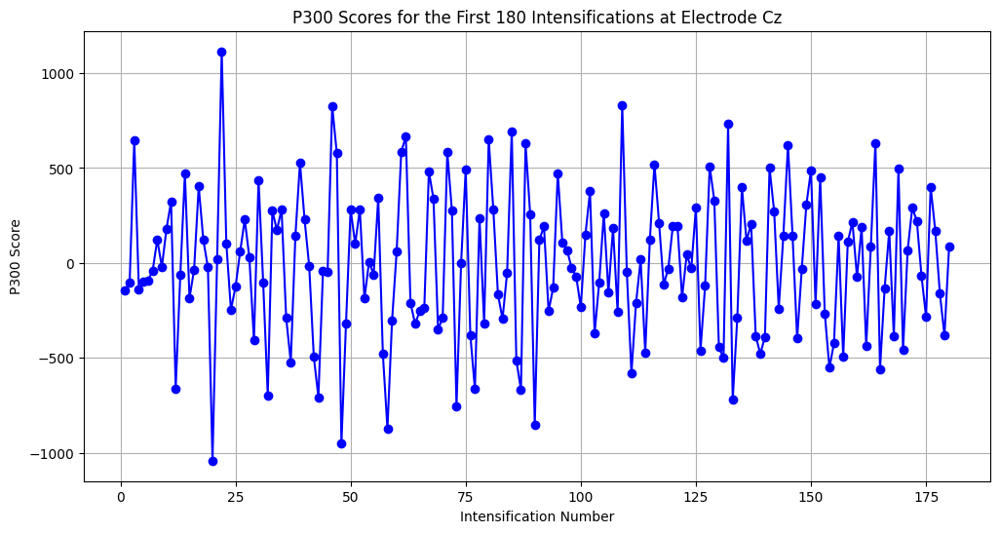

In [148]:
ch11_signal = signal[:, 10]

ch11_all_clips = extract_clippets(ch11_signal, all_start_indices)
all_labels = stimcode[all_start_indices]

# Print the shapes of the extracted clippets
print("Shape of all clips:", ch11_all_clips.shape)
print("Shape of all labels:", all_labels.shape)

# Define the time ranges for the P300 calculation
first_start = int(0.250 * 240)
first_end = int(0.450 * 240)
second_start = int(0.6 * 240)
second_end = int(0.7 * 240)

# Initialize a list to store P300 scores
all_scores = []
clips = ch11_all_clips
# Loop through the first 540 clips (assuming the first 540 intensifications)
for i in range(len(clips)):
    clip = clips[i]
    first = clip[first_start:first_end]
    second = clip[second_start:second_end]
    
    # Calculate the P300 score as the difference in the average of the two time windows
    p300score = np.mean(first) - np.mean(second)
    
    # Append the score to the list
    all_scores.append(p300score)

print("Shape of scores:", len(all_scores))

# Plot the first 180 P300 scores for each intensification at Electrode Cz
plt.figure(figsize=(12, 6))
plt.plot(range(1, 181), all_scores[:180], marker='o', color='b')
plt.title('P300 Scores for the First 180 Intensifications at Electrode Cz')
plt.xlabel('Intensification Number')
plt.ylabel('P300 Score')
plt.grid(True)
plt.show()

In [158]:
# third intensification score
print(len(all_scores))
print(all_scores[2])
print(all_scores)

540
646.0
[-146.33333333333337, -101.0, 646.0, -138.0, -100.33333333333334, -91.0, -39.66666666666666, 122.99999999999997, -20.666666666666664, 179.66666666666669, 325.0, -660.6666666666666, -64.33333333333334, 470.0, -184.33333333333331, -34.666666666666664, 403.66666666666663, 122.66666666666666, -22.666666666666657, -1040.6666666666667, 18.666666666666657, 1114.6666666666667, 103.66666666666666, -246.0, -125.33333333333334, 59.0, 230.00000000000003, 30.0, -407.0, 437.0, -100.99999999999999, -696.6666666666667, 275.0, 173.0, 282.66666666666663, -288.6666666666667, -521.6666666666666, 142.0, 528.0, 228.33333333333331, -15.666666666666629, -493.3333333333333, -706.0, -42.0, -47.333333333333336, 827.0, 578.0, -950.3333333333333, -317.3333333333333, 281.66666666666663, 100.33333333333331, 283.3333333333333, -187.00000000000003, 6.0, -61.0, 342.66666666666663, -477.0, -872.3333333333333, -304.3333333333333, 60.99999999999997, 586.6666666666666, 665.6666666666666, -209.0, -320.0, -254.3333

[ 1  2  3  4  5  6  7  8  9 10 11 12]


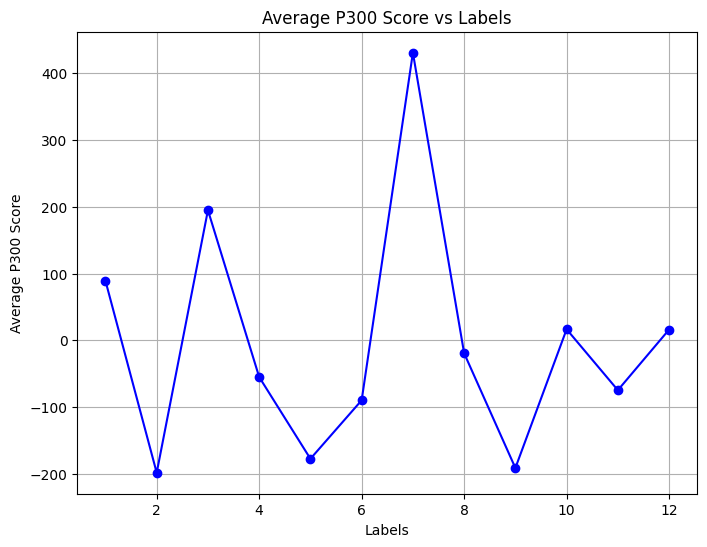

In [162]:
import numpy as np
import matplotlib.pyplot as plt

range_low = 1
range_high = 180

# Assuming scores and label are already defined
scores = np.array(all_scores[range_low:range_high])  # Slice the scores from range_low to range_high
scores_label = all_labels[range_low:range_high]  # Slice the labels from range_low to range_high

# Get the unique labels
unique_labels = np.unique(scores_label)
print(unique_labels)

# Initialize an empty list to store average scores
average_scores = []

# Calculate the average score for each label
for label in unique_labels:
    label_indices = np.where(scores_label == label)[0]  # Find indices for the current label
    average_score = np.mean(scores[label_indices])  # Calculate the average score for that label
    average_scores.append(average_score)

# Convert the list of averages to a numpy array
average_scores = np.array(average_scores)

# Plot the average scores against the unique labels
plt.figure(figsize=(8, 6))
plt.plot(unique_labels, average_scores, marker='o', linestyle='-', color='b')
plt.xlabel('Labels')
plt.ylabel('Average P300 Score')
plt.title('Average P300 Score vs Labels')
plt.grid(True)
plt.show()


(541, 240)
(541, 72)


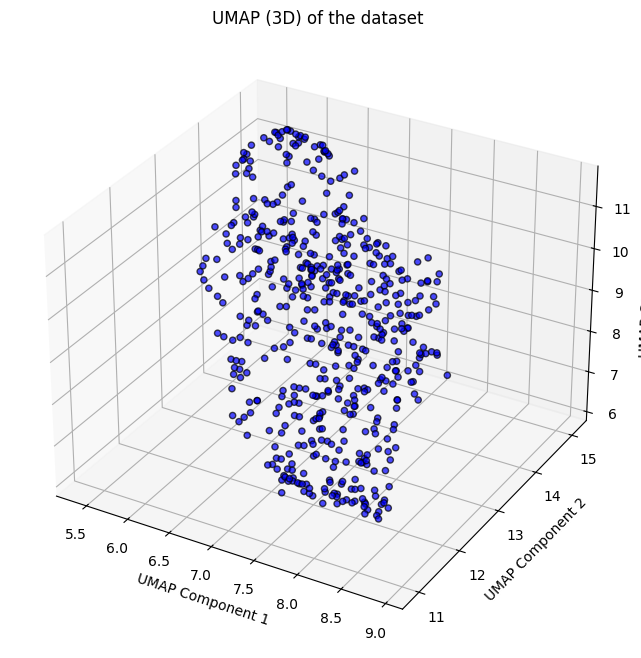

In [214]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import umap
from mpl_toolkits.mplot3d import Axes3D

# Define the time ranges for the P300 calculation
first_start = int(0.250 * 240)
first_end = int(0.450 * 240)
second_start = int(0.6 * 240)
second_end = int(0.7 * 240)

# Initialize a list to store P300 scores
interesting_clips = []
clips = ch11_all_clips
# Loop through the first 540 clips (assuming the first 540 intensifications)
for i in range(len(clips)):
    clip = clips[i]
    first = clip[first_start:first_end]
    second = clip[second_start:second_end]
    third = np.concatenate((first, second)) 
    interesting_clips.append(third)
final_clips = np.array(interesting_clips)

print(ch11_all_clips.shape)
print(final_clips.shape)

X=final_clips

## Standardize the data (important for UMAP)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform UMAP
umap_model = umap.UMAP(n_components=3)  # Reduce to 3 dimensions
X_umap = umap_model.fit_transform(X_scaled)

# Visualize the result (3D scatter plot)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_umap[:, 0], X_umap[:, 1], X_umap[:, 2], c='blue', edgecolor='black', alpha=0.7)
ax.set_title('UMAP (3D) of the dataset')
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
plt.show()

In [187]:
def get_scores(signals, stimcode, all_start_indices, target_start_indices):
    all_clips = extract_clippets(signals, all_start_indices)
    all_labels = stimcode[all_start_indices]
    all_groundtruth = stimcode[target_start_indices]

    # Define the time ranges for the P300 calculation
    first_start = int(0.250 * 240)
    first_end = int(0.450 * 240)
    second_start = int(0.6 * 240)
    second_end = int(0.7 * 240)

    # Initialize a list to store P300 scores
    all_scores = []
    clips = ch11_all_clips
    # Loop through the first 540 clips (assuming the first 540 intensifications)
    for i in range(len(clips)):
        clip = clips[i]
        first = clip[first_start:first_end]
        second = clip[second_start:second_end]
        
        # Calculate the P300 score as the difference in the average of the two time windows
        p300score = np.mean(first) - np.mean(second)
        
        # Append the score to the list
        all_scores.append(p300score)

    return all_scores, all_labels, all_groundtruth

test_scores, test_labels, test_groundtruth = get_scores(ch11_signal, stimcode, all_start_indices, target_start_indices)

In [216]:
def get_accuracy(scores, labels, groundtruth):
    scores = np.array(scores)
    # Get the unique labels
    unique_labels = np.unique(labels)
    unique_groundtruth = np.unique(groundtruth)

    # Initialize an empty list to store average scores
    average_scores = []

    # Calculate the average score for each label
    for label in unique_labels:
        label_indices = np.where(labels == label)[0]  # Find indices for the current label
        average_score = np.mean(scores[label_indices])  # Calculate the average score for that label
        average_scores.append(average_score)

    # Convert the list of averages to a numpy array
    average_scores = np.array(average_scores)

    # Convert the list of averages to a numpy array
    average_scores = np.array(average_scores)

    # Find the highest two labels based on their average scores
    highest_two_indices = np.argsort(average_scores)[-2:]  # Indices of top 2 labels
    highest_two_labels = unique_labels[highest_two_indices]
    highest_two_scores = average_scores[highest_two_indices]

    result = False
    if set(unique_groundtruth.tolist()) == set(highest_two_labels.tolist()):
        # print("Groundtruth and highest two labels are the same.")
        # print("Ground truth", unique_groundtruth.tolist())
        # print("Highest scores", highest_two_labels.tolist())
        result = True
    else:
        # print("Groundtruth and highest two labels are different.")
        # print("Ground truth", unique_groundtruth.tolist())
        # print("Highest scores are", highest_two_labels.tolist())
        result = False

    return result, highest_two_labels, highest_two_scores, unique_groundtruth

result, highest_two_labels, highest_two_scores, truth = get_accuracy(test_scores[1:180], test_labels[1:180], test_groundtruth[1:30])


### Dataset

In [219]:
session10_files = [r'data\AAS010R01.mat', r'data\AAS010R02.mat', r'data\AAS010R03.mat', r'data\AAS010R04.mat', r'data\AAS010R05.mat']

session10_result = []
for file_name in session10_files:
    # Load the .mat file (replace 'data/AAS010R01.mat' with your actual file path)
    mat_data = scipy.io.loadmat(file_name)  # or use 'data/AAS010R01.mat'
    signal = mat_data['signal']
    stimcode = mat_data['StimulusCode']
    stimtype = mat_data['StimulusType']
    print("*** New File ", file_name)
    # target
    target_indices = np.where(np.isin(stimtype, 1))[0]
    # non target
    non_target_indices = np.where(np.isin(stimtype, 0))[0]
    stim_indices = np.where(stimcode != 0)[0]
    non_target_common_indices = np.intersect1d(non_target_indices, stim_indices)
    # Find the start of continuous sequences
    target_start_indices = target_indices[np.insert(np.diff(target_indices) > 1, 0, True)]
    nontarget_start_indices = non_target_common_indices[np.insert(np.diff(non_target_common_indices) > 1, 0, True)]
    all_start_indices = stim_indices[np.insert(np.diff(stim_indices) > 1, 0, True)]
    # print("length of start indices", len(all_start_indices))
    num_char = int(len(all_start_indices)/180)
    # print("number of character", num_char)

    #run algorithm
    ch11_signal = signal[:, 10]
    ch11_all_clips = extract_clippets(ch11_signal, all_start_indices)
    all_labels = stimcode[all_start_indices]

    test_scores, test_labels, test_groundtruth = get_scores(ch11_signal, stimcode, all_start_indices, target_start_indices)
    for i in range(num_char):
        # print("Character number ", i)
        begin = 1+i*180
        end = begin+180-1
        begin2 = 1+i*30
        end2 = begin2+4
        result, highest_two_labels, highest_two_scores, truth = get_accuracy(test_scores[begin:end], test_labels[begin:end], test_groundtruth[begin2:end2])
        print(result, highest_two_labels, truth)
        session10_result.append(result)
    print("\n")

print(session10_result)
# Calculate the percentage of True values
percentage_true = np.sum(session10_result) / len(session10_result) * 100
print(percentage_true)

*** New File  data\AAS010R01.mat
True [3 7] [3 7]
True [7 1] [1 7]
True [ 2 10] [ 2 10]


*** New File  data\AAS010R02.mat
True [4 7] [4 7]
False [3 6] [3 9]
False [5 1] [1 8]


*** New File  data\AAS010R03.mat
True [6 7] [6 7]
False [12  8] [3 8]
True [10  1] [ 1 10]
False [5 8] [2 8]


*** New File  data\AAS010R04.mat
False [ 6 10] [ 5 10]
True [1 7] [1 7]
False [ 1 10] [ 2 10]
True [7 5] [5 7]
True [6 9] [6 9]


*** New File  data\AAS010R05.mat
True [7 2] [2 7]
True [3 9] [3 9]
True [10  5] [ 5 10]
True [8 6] [6 8]


[True, True, True, True, False, False, True, False, True, False, False, True, False, True, True, True, True, True, True]
68.42105263157895


In [220]:
session11_files = [r'data\AAS011R01.mat', r'data\AAS011R02.mat', r'data\AAS011R03.mat', r'data\AAS011R04.mat', r'data\AAS011R05.mat', r'data\AAS011R06.mat']

session11_result = []
for file_name in session11_files:
    
    mat_data = scipy.io.loadmat(file_name)  # or use 'data/AAS010R01.mat'
    signal = mat_data['signal']
    stimcode = mat_data['StimulusCode']
    stimtype = mat_data['StimulusType']
    print("*** New File ", file_name)
    # target
    target_indices = np.where(np.isin(stimtype, 1))[0]
    # non target
    non_target_indices = np.where(np.isin(stimtype, 0))[0]
    stim_indices = np.where(stimcode != 0)[0]
    non_target_common_indices = np.intersect1d(non_target_indices, stim_indices)
    # Find the start of continuous sequences
    target_start_indices = target_indices[np.insert(np.diff(target_indices) > 1, 0, True)]
    nontarget_start_indices = non_target_common_indices[np.insert(np.diff(non_target_common_indices) > 1, 0, True)]
    all_start_indices = stim_indices[np.insert(np.diff(stim_indices) > 1, 0, True)]
    # print("length of start indices", len(all_start_indices))
    num_char = int(len(all_start_indices)/180)
    # print("number of character", num_char)

    #run algorithm
    ch11_signal = signal[:, 10]
    ch11_all_clips = extract_clippets(ch11_signal, all_start_indices)
    all_labels = stimcode[all_start_indices]

    test_scores, test_labels, test_groundtruth = get_scores(ch11_signal, stimcode, all_start_indices, target_start_indices)
    for i in range(num_char):
        # print("Character number ", i)
        begin = 1+i*180
        end = begin+180-1
        begin2 = 1+i*30
        end2 = begin2+4
        result, highest_two_labels, highest_two_scores, truth = get_accuracy(test_scores[begin:end], test_labels[begin:end], test_groundtruth[begin2:end2])
        print(result, highest_two_labels, truth)
        session11_result.append(result)
    print("\n")

print(session11_result)
# Calculate the percentage of True values
percentage_true = np.sum(session11_result) / len(session11_result) * 100
print(percentage_true)

*** New File  data\AAS011R01.mat
False [2 7] [2 8]
False [ 1 12] [1 7]
False [ 4 10] [ 2 10]


*** New File  data\AAS011R02.mat
False [6 1] [2 8]
True [1 7] [1 7]
False [ 2 12] [ 2 10]


*** New File  data\AAS011R03.mat
True [1 8] [1 8]
True [6 8] [6 8]
False [9 6] [3 9]
False [ 8 10] [ 4 10]
True [5 7] [5 7]


*** New File  data\AAS011R04.mat
False [11 10] [ 1 10]
True [2 8] [2 8]
False [9 7] [3 9]
True [7 5] [5 7]
False [ 6 10] [ 1 10]


*** New File  data\AAS011R05.mat
False [5 7] [6 7]
True [8 3] [3 8]
False [2 3] [ 1 10]
False [10  8] [2 8]


*** New File  data\AAS011R06.mat
True [9 6] [6 9]
False [8 1] [1 7]
True [10  2] [ 2 10]


[False, False, False, False, True, False, True, True, False, False, True, False, True, False, True, False, False, True, False, False, True, False, True]
39.130434782608695


In [205]:
together = session10_result + session11_result
percentage_true = np.sum(together) / len(together) * 100
print(percentage_true)

52.38095238095239
